<a href="https://colab.research.google.com/github/aml-2023/final-project/blob/main/detr_object_detection_finetuning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Fine-tuning DETR on a custom dataset for object detection

In this notebook, we are going to fine-tune [DETR](https://huggingface.co/docs/transformers/model_doc/detr) (end-to-end object detection with Transformers) on a custom object detection dataset. The goal for the model is to detect balloons in pictures.

* Original DETR paper: https://arxiv.org/abs/2005.12872
* Original DETR repo: https://github.com/facebookresearch/detr

### Note regarding GPU memory

`DetrImageProcessor` by default resizes each image to have a `min_size` of 800 pixels and a `max_size` of 1333 pixels (as these are the default values that DETR uses at *inference* time). Note that this can stress-test the memory of your GPU when *training* the model, as the images are flattened after sent through the convolutional backbone. The sequence length that is sent through the Transformer is typically of length (height*width/32^2). So if you consider an image of size (900, 900) for example, the sequence length is 900^2/32^2 = 791, which is larger than what NLP models like BERT use (512). It's advised to use a batch size of 2 on a single GPU. You can of course also initialize `DetrImageProcessor` with a smaller `size` and/or `max_size` to use bigger batches.


### Note regarding data augmentation

DETR actually uses several image augmentations during training. One of them is **scale augmentation**: they set the `min_size` randomly to be one of [480, 512, 544, 576, 608, 640, 672, 704, 736, 768, 800] as can be seen [here](https://github.com/facebookresearch/detr/blob/a54b77800eb8e64e3ad0d8237789fcbf2f8350c5/datasets/coco.py#L122). However, we are not going to add any of the augmentations that are used in the original implementation during training. It works fine without them.

### Training framework

We're going to fine-tune the model using [PyTorch Lightning](https://lightning.ai/pages/open-source/), but of course you could also train the model using native PyTorch, the 🤗 [Trainer](https://huggingface.co/docs/transformers/main_classes/trainer) class, 🤗 [Accelerate](https://huggingface.co/docs/accelerate/index), or any other framework you prefer.

Also big thanks to the creator of [this notebook](https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb), which helped me a lot in understanding how to fine-tune DETR on a custom dataset.


## Install Requirements

As a first step, we will download the `requirements.txt` file from the github repo and install all the needed packages.

In [1]:
!wget -O requirements.txt https://raw.githubusercontent.com/aml-2023/final-project/detr/requirements.txt
!pip install -q -r requirements.txt

--2023-12-12 19:39:33--  https://raw.githubusercontent.com/aml-2023/final-project/detr/requirements.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.109.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 108 [text/plain]
Saving to: ‘requirements.txt’

requirements.txt    100%[===================>]     108  --.-KB/s    in 0s      

2023-12-12 19:39:33 (2.87 MB/s) - ‘requirements.txt’ saved [108/108]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 776.9/776.9 kB 12.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 123.4/123.4 kB 16.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 59.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 93.5/93.5 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 

## Fetch Data
The garbage dataset comes in the COCO format, which the `DetrImageProcessor` class can use directly. First, we download the `fetch_data.sh` script from the github repo and then after running it, we will have all of the data inside a `data/` folder.

In [2]:
!wget -O fetch_data.sh https://raw.githubusercontent.com/aml-2023/final-project/detr/fetch_data.sh
!bash fetch_data.sh

--2023-12-12 19:39:54--  https://raw.githubusercontent.com/aml-2023/final-project/detr/fetch_data.sh
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 531 [text/plain]
Saving to: ‘fetch_data.sh’

fetch_data.sh       100%[===================>]     531  --.-KB/s    in 0s      

2023-12-12 19:39:54 (21.2 MB/s) - ‘fetch_data.sh’ saved [531/531]

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   885  100   885    0     0    429      0  0:00:02  0:00:02 --:--:--   429
100  274M  100  274M    0     0  55.5M      0  0:00:04  0:00:04 --:--:--  109M
Archive:  roboflow.zip
 extracting: data/README.dataset.txt  
 extracting: data/README.roboflow.txt  
   creat

## Connect to the DERT github repository

And import from it the needed modules

In [3]:
!git clone https://github.com/facebookresearch/detr.git


import sys
sys.path.append('./detr/')

from detr.models.matcher import HungarianMatcher
from detr.models.detr import SetCriterion

Cloning into 'detr'...
remote: Enumerating objects: 263, done.
remote: Total 263 (delta 0), reused 0 (delta 0), pack-reused 263
Receiving objects: 100% (263/263), 12.88 MiB | 15.68 MiB/s, done.
Resolving deltas: 100% (122/122), done.


## Create PyTorch dataset + dataloaders

The standard way in PyTorch to train a model is by creating datasets and a corresponding dataloaders. See [this guide](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html) if you're not familiar with them.

Here we define a regular PyTorch dataset. Each item of the dataset is an image and corresponding annotations. Torchvision already provides a `CocoDetection` dataset, which we can use. We only add an image processor (`DetrImageProcessor`) to resize + normalize the images, and to turn the annotations (which are in COCO format) in the format that DETR expects. It will also resize the annotations accordingly.

In [5]:
import torchvision
import torch
import os

class CocoDetection(torchvision.datasets.CocoDetection):
    def __init__(self, img_folder, processor, train=True):
        ann_file = os.path.join(img_folder, "_annotations.coco.json")
        super(CocoDetection, self).__init__(img_folder, ann_file)
        self.processor = processor

    def __getitem__(self, idx):
        # read in PIL image and target in COCO format
        # feel free to add data augmentation here before passing them to the next step
        img, target = super(CocoDetection, self).__getitem__(idx)

        # preprocess image and target (converting target to DETR format, resizing + normalization of both image and target)
        image_id = self.ids[idx]
        target = {'image_id': image_id, 'annotations': target}
        encoding = self.processor(images=img, annotations=target, return_tensors="pt")
        pixel_values = encoding["pixel_values"].squeeze() # remove batch dimension
        target = encoding["labels"][0] # remove batch dimension

        return pixel_values, target

In [6]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

Based on the class defined above, we create training, validation, and test datasets.

---



In [7]:
from transformers import DetrImageProcessor

processor = DetrImageProcessor.from_pretrained("facebook/detr-resnet-50")

train_dataset = CocoDetection(img_folder='data/train', processor=processor)
val_dataset = CocoDetection(img_folder='data/valid', processor=processor, train=False)
test_dataset = CocoDetection(img_folder='data/test', processor=processor, train=False)

preprocessor_config.json:   0%|          | 0.00/274 [00:00<?, ?B/s]

The `max_size` parameter is deprecated and will be removed in v4.26. Please specify in `size['longest_edge'] instead`.


loading annotations into memory...
Done (t=0.09s)
creating index...
index created!
loading annotations into memory...
Done (t=0.00s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


As you can see, this dataset is tiny:

In [8]:
print("Number of training examples:", len(train_dataset))
print("Number of validation examples:", len(val_dataset))
print("Number of test examples:", len(test_dataset))

Number of training examples: 3027
Number of validation examples: 306
Number of test examples: 201


Let's verify an example by visualizing it. We can access the COCO API of the dataset by typing `train_dataset.coco`.

Image n°1608


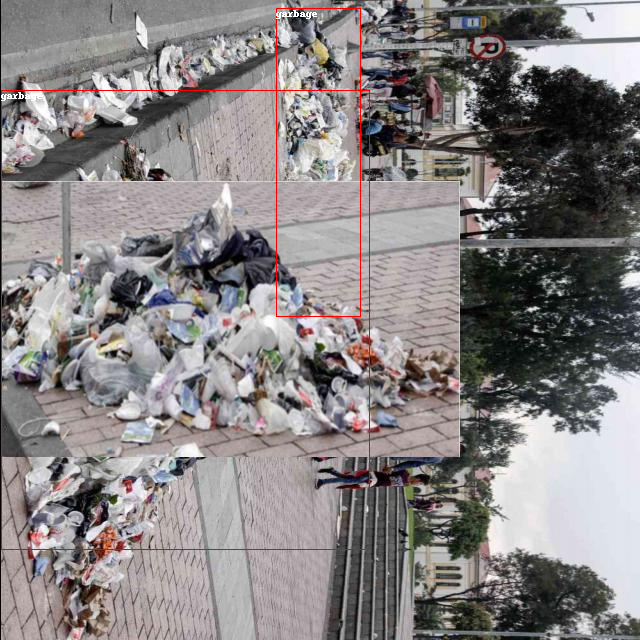

In [9]:
import numpy as np
import os
from PIL import Image, ImageDraw

# based on https://github.com/woctezuma/finetune-detr/blob/master/finetune_detr.ipynb
image_ids = train_dataset.coco.getImgIds()
# let's pick a random image
image_id = image_ids[np.random.randint(0, len(image_ids))]
print('Image n°{}'.format(image_id))
image = train_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('data/train', image['file_name']))

annotations = train_dataset.coco.imgToAnns[image_id]
draw = ImageDraw.Draw(image, "RGBA")

cats = train_dataset.coco.cats
id2label = {k: v['name'] for k,v in cats.items()}

for annotation in annotations:
  box = annotation['bbox']
  class_idx = annotation['category_id']
  x,y,w,h = tuple(box)
  draw.rectangle((x,y,x+w,y+h), outline='red', width=1)
  draw.text((x, y), id2label[class_idx], fill='white')

image

Next, let's create corresponding PyTorch dataloaders, which allow us to get batches of data. We define a custom `collate_fn` to batch images together. As DETR resizes images to have a min size of 800 and a max size of 1333, images can have different sizes. We pad images (`pixel_values`) to the largest image in a batch, and create a corresponding `pixel_mask` to indicate which pixels are real (1)/which are padding (0).  

In [10]:
from torch.utils.data import DataLoader

def collate_fn(batch):
  pixel_values = [item[0] for item in batch]
  encoding = processor.pad(pixel_values, return_tensors="pt")
  labels = [item[1] for item in batch]
  batch = {}
  batch['pixel_values'] = encoding['pixel_values']
  batch['pixel_mask'] = encoding['pixel_mask']
  batch['labels'] = labels
  return batch

train_dataloader = DataLoader(train_dataset, collate_fn=collate_fn, batch_size=4, shuffle=True)
val_dataloader = DataLoader(val_dataset, collate_fn=collate_fn, batch_size=2)
test_dataloader = DataLoader(test_dataset, collate_fn=collate_fn, batch_size=2)
batch = next(iter(train_dataloader))

## Subsetting the Data
We don't need to fine tune the model on all of the data, it is enough to just take a small part of it. This also helps with speeding up the training immensely.

As a start, we take only 10% of images.

In [11]:
train_subset_size = int(0.1 * len(train_dataset))

# randomly sample 10% of indeces
train_subset_idx = np.random.randint(low=0, high=len(train_dataset), size=(train_subset_size))
trainset_subset = torch.utils.data.Subset(train_dataset, train_subset_idx)
train_subset_loader = DataLoader(trainset_subset, collate_fn=collate_fn, batch_size=4, shuffle=True)
batch = next(iter(train_subset_loader))

In [12]:
val_subset_size = int(0.1 * len(val_dataset))

# randomly sample 10% of indeces
val_subset_idx = np.random.randint(low=0, high=len(val_dataset), size=(val_subset_size))
val_subset = torch.utils.data.Subset(val_dataset, val_subset_idx)
val_subset_loader = DataLoader(val_subset, collate_fn=collate_fn, batch_size=2)

In [13]:
test_subset_size = int(0.1 * len(test_dataset))

# randomly sample 10% of indeces
test_subset_idx = np.random.randint(low=0, high=len(test_dataset), size=(test_subset_size))
test_subset = torch.utils.data.Subset(test_dataset, test_subset_idx)
test_subset_loader = DataLoader(test_subset, collate_fn=collate_fn, batch_size=2)

Let's verify the keys of a single batch:

In [14]:
batch.keys()

dict_keys(['pixel_values', 'pixel_mask', 'labels'])

Let's verify the shape of the `pixel_values`, and check the `target`::

In [15]:
pixel_values, target = train_dataset[0]

In [16]:
pixel_values.shape

torch.Size([3, 800, 800])

In [17]:
print(target.keys())

dict_keys(['size', 'image_id', 'class_labels', 'boxes', 'area', 'iscrowd', 'orig_size'])


# Train the model

In order to finetune the model we will download the pretrained version from
torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)

Ad mainly follow and adapt [this](https://www.kaggle.com/code/tanulsingh077/end-to-end-object-detection-with-transformers-detr) kaggle notebook.

#### Model definition

In [18]:
import torch.nn as nn
import matplotlib.pyplot as plt

class DETRModel(nn.Module):
    def __init__(self,num_classes,num_queries):
        super(DETRModel,self).__init__()
        self.num_classes = num_classes
        self.num_queries = num_queries

        # Load the pretrained model
        self.model = torch.hub.load('facebookresearch/detr', 'detr_resnet50', pretrained=True)
        self.in_features = self.model.class_embed.in_features

        # Create a new layer for the classification part of the DETR
        self.model.class_embed = nn.Linear(in_features=self.in_features,out_features=self.num_classes)
        self.model.num_queries = self.num_queries

    def forward(self,images):
        return self.model(images)


seed = 42
num_classes = 2
num_queries = 100
null_class_coef = 0.5
BATCH_SIZE = 8
LR = 2e-5
EPOCHS = 25

model = DETRModel(num_classes, num_queries)

Downloading: "https://github.com/facebookresearch/detr/zipball/main" to /root/.cache/torch/hub/main.zip
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 66.3MB/s]
Downloading: "https://dl.fbaipublicfiles.com/detr/detr-r50-e632da11.pth" to /root/.cach

Class that defines the object that will compute the average losses and metrics

In [19]:
class AverageMeter(object):
    """Computes and stores the average and current value"""
    def __init__(self):
        self.reset()

    def reset(self):
        self.val = 0
        self.avg = 0
        self.sum = 0
        self.count = 0

    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

Training and evaluation (over the validation set) functions

In [20]:
def eval_fn(data_loader, model, criterion, device):

    model.eval()
    criterion.eval()
    summary_loss = AverageMeter()
    mapping_keys = {'size': 'size', 'image_id': 'image_id',
                    'class_labels': 'labels', 'boxes': 'boxes',
                     'area':  'area', 'iscrowd': 'iscrowd',
                    'orig_size': 'orig_size'}

    with torch.no_grad():
      for batch_idx, batch in enumerate(data_loader):
          batch_images = batch['pixel_values'].to(device)
          batch_targets = batch['pixel_mask']
          batch_labels = batch['labels']

          targets = [{mapping_keys[key]: value.to(device) for key,value in target.items() } for target in batch_labels]
          images = list(image.to(device) for image in batch_images)
          output = model(images)

          loss_dict = criterion(output, targets)
          weight_dict = criterion.weight_dict

          losses = sum(loss_dict[k] * weight_dict[k] for k in loss_dict.keys() if k in weight_dict)

          summary_loss.update(losses.item(),BATCH_SIZE)
          batch_images.detach()
          [[value.detach() for _,value in target.items()] for target in batch_labels]

    return summary_loss

In [23]:
def train_fn(data_loader,model,criterion,optimizer,device,scheduler,epoch):
    model.train()
    criterion.train()

    summary_loss = AverageMeter()
    targets = {}
    mapping_keys = {'size': 'size', 'image_id': 'image_id',
                    'class_labels': 'labels', 'boxes': 'boxes',
                     'area':  'area', 'iscrowd': 'iscrowd',
                    'orig_size': 'orig_size'}


    for batch_idx, batch in enumerate(data_loader):
        batch_images = batch['pixel_values'].to(device)
        batch_targets = batch['pixel_mask']
        batch_labels = batch['labels']


        targets = [{mapping_keys[key]: value.to(device) for key,value in target.items() } for target in batch_labels]
        images = list(image.to(device) for image in batch_images)

        output = model(images)

        loss_dict = criterion(output, targets)
        weight_dict = criterion.weight_dict

        losses = sum(loss_dict[k] * weight_dict[k] for k in loss_dict.keys() if k in weight_dict)

        optimizer.zero_grad()

        losses.backward()
        optimizer.step()
        if scheduler is not None:
            scheduler.step()

        summary_loss.update(losses.item(),BATCH_SIZE)

        batch_images.detach()
        [[value.detach() for _,value in target.items()] for target in batch_labels]

        if (batch_idx + 1) % 10 == 0:
                print(f"Epoch {epoch + 1}/{EPOCHS}, Batch {batch_idx + 1}/{len(data_loader)}, Loss: {losses.item():.4f}")


    return summary_loss

In [25]:
matcher = HungarianMatcher()
weight_dict = weight_dict = {'loss_ce': 1, 'loss_bbox': 1 , 'loss_giou': 1}
losses = ['labels', 'boxes', 'cardinality']


def run(model, EPOCHS, LR):
    device = torch.device('cuda')
    model.to(device)
    criterion = SetCriterion(num_classes-1, matcher, weight_dict, eos_coef = null_class_coef, losses=losses)
    criterion = criterion.to(device)
    LOSS_V = []
    LOSS_T = []

    optimizer = torch.optim.AdamW(model.parameters(), lr=LR)

    best_loss = 10**5
    for epoch in range(EPOCHS):
        train_loss = train_fn(train_subset_loader, model,criterion, optimizer,device,scheduler=None,epoch=epoch)
        valid_loss = eval_fn(val_subset_loader, model,criterion, device)

        print('|EPOCH {}| TRAIN_LOSS {}| VALID_LOSS {}|'.format(epoch+1,train_loss.avg,valid_loss.avg))
        LOSS_V.append(valid_loss.avg)
        LOSS_T.append(train_loss.avg)

        plt.plot(range(len(LOSS_T)), LOSS_T, label='Train')
        plt.plot(range(len(LOSS_T)), LOSS_V, label='Validation')
        plt.show()

        if valid_loss.avg < best_loss:
            best_loss = valid_loss.avg
            print('Best model found in Epoch {}........Saving Model'.format(epoch+1))
            torch.save(model.state_dict(), f'detr_best_{epoch}.pth')

Epoch 1/90, Batch 10/76, Loss: 0.8495
Epoch 1/90, Batch 20/76, Loss: 0.8585
Epoch 1/90, Batch 30/76, Loss: 0.4949
Epoch 1/90, Batch 40/76, Loss: 1.4679
Epoch 1/90, Batch 50/76, Loss: 0.5927
Epoch 1/90, Batch 60/76, Loss: 0.7582
Epoch 1/90, Batch 70/76, Loss: 0.5469
|EPOCH 1| TRAIN_LOSS 0.7546991999996336| VALID_LOSS 0.46128634214401243|


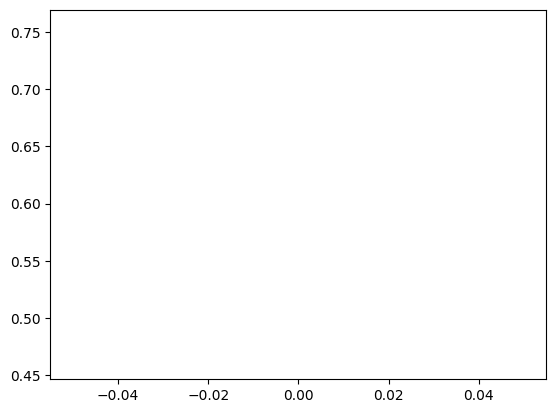

Best model found in Epoch 1........Saving Model
Epoch 2/90, Batch 10/76, Loss: 0.4463
Epoch 2/90, Batch 20/76, Loss: 0.5185
Epoch 2/90, Batch 30/76, Loss: 0.8050
Epoch 2/90, Batch 40/76, Loss: 1.6403
Epoch 2/90, Batch 50/76, Loss: 0.2535
Epoch 2/90, Batch 60/76, Loss: 0.8780
Epoch 2/90, Batch 70/76, Loss: 0.4757
|EPOCH 2| TRAIN_LOSS 0.6151682075701261| VALID_LOSS 0.9588825583457947|


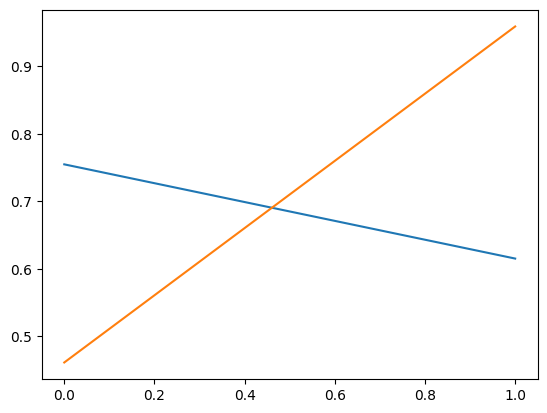

Epoch 3/90, Batch 10/76, Loss: 0.5089
Epoch 3/90, Batch 20/76, Loss: 0.3598
Epoch 3/90, Batch 30/76, Loss: 0.7392
Epoch 3/90, Batch 40/76, Loss: 1.0444
Epoch 3/90, Batch 50/76, Loss: 0.3068
Epoch 3/90, Batch 60/76, Loss: 0.7345
Epoch 3/90, Batch 70/76, Loss: 0.3963
|EPOCH 3| TRAIN_LOSS 0.6414236469488395| VALID_LOSS 1.0271256605784098|


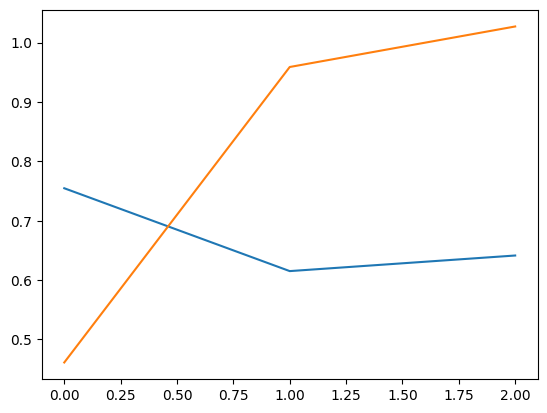

Epoch 4/90, Batch 10/76, Loss: 0.8158
Epoch 4/90, Batch 20/76, Loss: 0.4707
Epoch 4/90, Batch 30/76, Loss: 0.5793
Epoch 4/90, Batch 40/76, Loss: 0.6355
Epoch 4/90, Batch 50/76, Loss: 0.7907
Epoch 4/90, Batch 60/76, Loss: 0.7449
Epoch 4/90, Batch 70/76, Loss: 0.9632
|EPOCH 4| TRAIN_LOSS 0.5907383612111995| VALID_LOSS 0.9495854258537293|


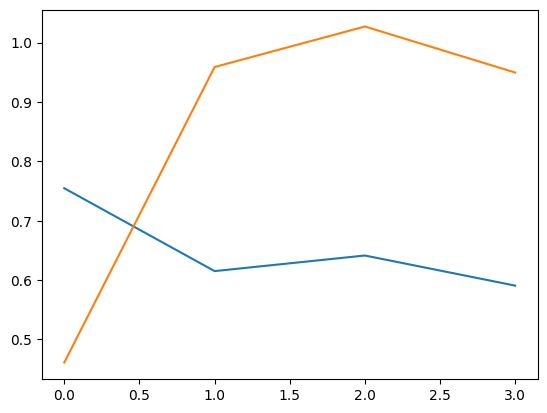

Epoch 5/90, Batch 10/76, Loss: 0.5451
Epoch 5/90, Batch 20/76, Loss: 0.3348
Epoch 5/90, Batch 30/76, Loss: 0.5599
Epoch 5/90, Batch 40/76, Loss: 0.7923
Epoch 5/90, Batch 50/76, Loss: 0.2607
Epoch 5/90, Batch 60/76, Loss: 0.4522
Epoch 5/90, Batch 70/76, Loss: 0.6146
|EPOCH 5| TRAIN_LOSS 0.6060968919804222| VALID_LOSS 0.44897568225860596|


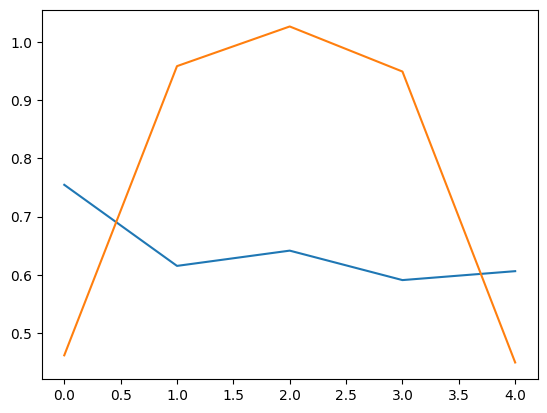

Best model found in Epoch 5........Saving Model
Epoch 6/90, Batch 10/76, Loss: 0.5719
Epoch 6/90, Batch 20/76, Loss: 0.4546
Epoch 6/90, Batch 30/76, Loss: 0.5365
Epoch 6/90, Batch 40/76, Loss: 0.3103
Epoch 6/90, Batch 50/76, Loss: 0.5832
Epoch 6/90, Batch 60/76, Loss: 0.3331
Epoch 6/90, Batch 70/76, Loss: 0.3718
|EPOCH 6| TRAIN_LOSS 0.49493261191405746| VALID_LOSS 1.3536025206247966|


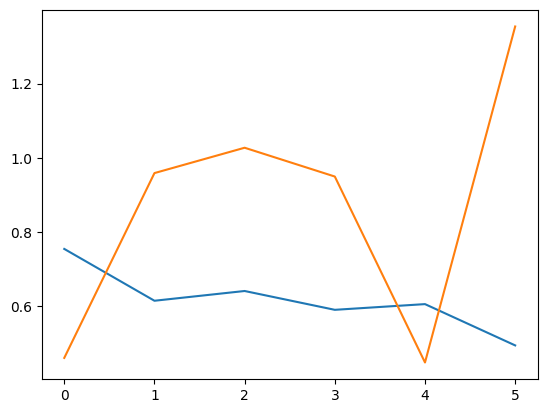

Epoch 7/90, Batch 10/76, Loss: 0.4971
Epoch 7/90, Batch 20/76, Loss: 0.5120
Epoch 7/90, Batch 30/76, Loss: 0.5477
Epoch 7/90, Batch 40/76, Loss: 0.2720
Epoch 7/90, Batch 50/76, Loss: 0.9211
Epoch 7/90, Batch 60/76, Loss: 0.6689
Epoch 7/90, Batch 70/76, Loss: 0.5767
|EPOCH 7| TRAIN_LOSS 0.4932020265412958| VALID_LOSS 1.0000956177711486|


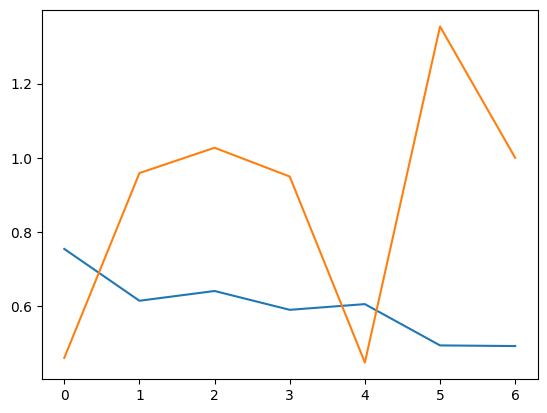

Epoch 8/90, Batch 10/76, Loss: 0.2632
Epoch 8/90, Batch 20/76, Loss: 0.3845
Epoch 8/90, Batch 30/76, Loss: 0.3197
Epoch 8/90, Batch 40/76, Loss: 0.3525
Epoch 8/90, Batch 50/76, Loss: 0.4125
Epoch 8/90, Batch 60/76, Loss: 0.5096
Epoch 8/90, Batch 70/76, Loss: 0.5749
|EPOCH 8| TRAIN_LOSS 0.48452544388802427| VALID_LOSS 1.0084174036979676|


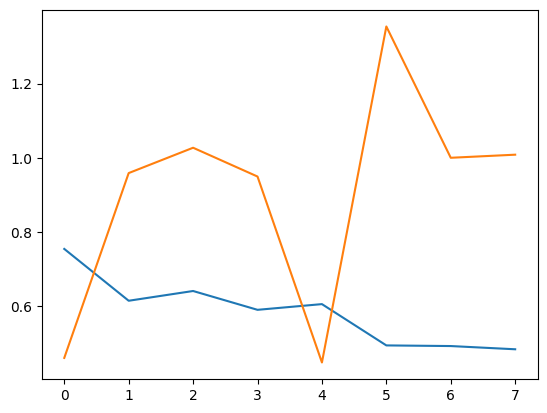

Epoch 9/90, Batch 10/76, Loss: 0.3086
Epoch 9/90, Batch 20/76, Loss: 0.3568
Epoch 9/90, Batch 30/76, Loss: 0.1728
Epoch 9/90, Batch 40/76, Loss: 0.3700
Epoch 9/90, Batch 50/76, Loss: 0.4930
Epoch 9/90, Batch 60/76, Loss: 0.3559
Epoch 9/90, Batch 70/76, Loss: 0.3506
|EPOCH 9| TRAIN_LOSS 0.47087023171939346| VALID_LOSS 1.5369548638661703|


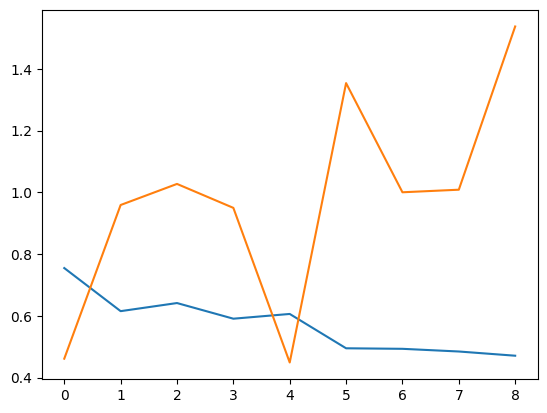

Epoch 10/90, Batch 10/76, Loss: 0.5110
Epoch 10/90, Batch 20/76, Loss: 0.3230
Epoch 10/90, Batch 30/76, Loss: 0.5706
Epoch 10/90, Batch 40/76, Loss: 0.3476
Epoch 10/90, Batch 50/76, Loss: 0.5104
Epoch 10/90, Batch 60/76, Loss: 1.0202
Epoch 10/90, Batch 70/76, Loss: 0.3869
|EPOCH 10| TRAIN_LOSS 0.4568362098775412| VALID_LOSS 1.2787182887395223|


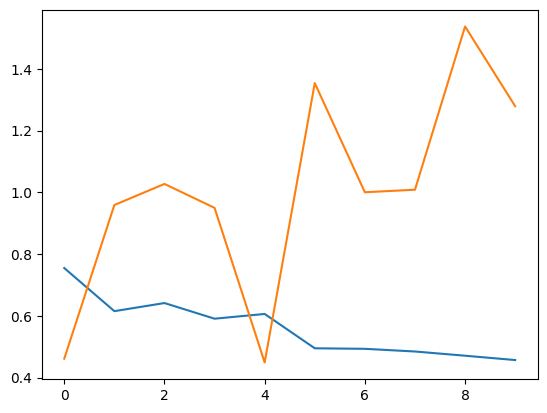

Epoch 11/90, Batch 10/76, Loss: 0.3548
Epoch 11/90, Batch 20/76, Loss: 0.4433
Epoch 11/90, Batch 30/76, Loss: 0.6341
Epoch 11/90, Batch 40/76, Loss: 0.3249
Epoch 11/90, Batch 50/76, Loss: 0.3061
Epoch 11/90, Batch 60/76, Loss: 0.3618
Epoch 11/90, Batch 70/76, Loss: 0.2943
|EPOCH 11| TRAIN_LOSS 0.4638081367470716| VALID_LOSS 1.1858110944430034|


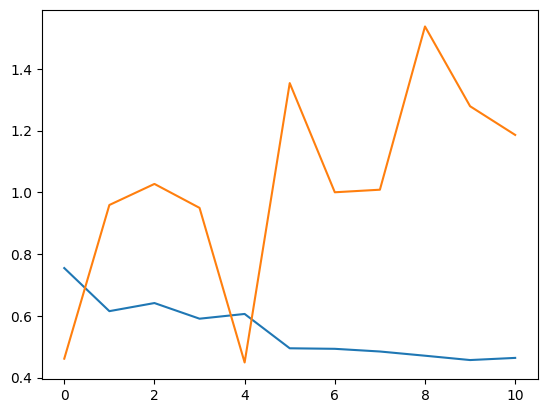

Epoch 12/90, Batch 10/76, Loss: 0.4092
Epoch 12/90, Batch 20/76, Loss: 0.3896
Epoch 12/90, Batch 30/76, Loss: 0.2198
Epoch 12/90, Batch 40/76, Loss: 0.6043
Epoch 12/90, Batch 50/76, Loss: 0.5954
Epoch 12/90, Batch 60/76, Loss: 0.2768
Epoch 12/90, Batch 70/76, Loss: 0.3404
|EPOCH 12| TRAIN_LOSS 0.41804324884555844| VALID_LOSS 1.1727928280830384|


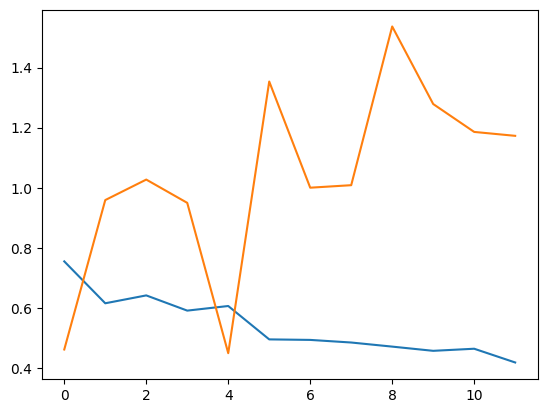

Epoch 13/90, Batch 10/76, Loss: 0.3287
Epoch 13/90, Batch 20/76, Loss: 0.2543
Epoch 13/90, Batch 30/76, Loss: 0.3975
Epoch 13/90, Batch 40/76, Loss: 0.5523
Epoch 13/90, Batch 50/76, Loss: 0.2656
Epoch 13/90, Batch 60/76, Loss: 0.5616
Epoch 13/90, Batch 70/76, Loss: 0.3346
|EPOCH 13| TRAIN_LOSS 0.4336349521028368| VALID_LOSS 1.0858686089515686|


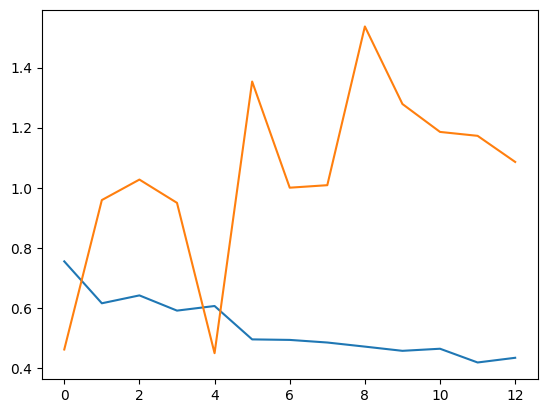

Epoch 14/90, Batch 10/76, Loss: 0.5297
Epoch 14/90, Batch 20/76, Loss: 0.7483
Epoch 14/90, Batch 30/76, Loss: 0.8434
Epoch 14/90, Batch 40/76, Loss: 0.7837
Epoch 14/90, Batch 50/76, Loss: 0.5860
Epoch 14/90, Batch 60/76, Loss: 0.3051
Epoch 14/90, Batch 70/76, Loss: 0.5295
|EPOCH 14| TRAIN_LOSS 0.435794198983594| VALID_LOSS 1.2445738236109416|


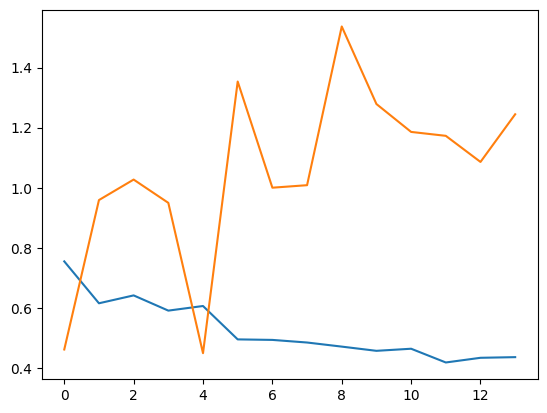

Epoch 15/90, Batch 10/76, Loss: 0.3198
Epoch 15/90, Batch 20/76, Loss: 0.4871
Epoch 15/90, Batch 30/76, Loss: 0.2777
Epoch 15/90, Batch 40/76, Loss: 0.1458
Epoch 15/90, Batch 50/76, Loss: 0.3374
Epoch 15/90, Batch 60/76, Loss: 0.2702
Epoch 15/90, Batch 70/76, Loss: 0.1574
|EPOCH 15| TRAIN_LOSS 0.41138087918883876| VALID_LOSS 0.3879887779553731|


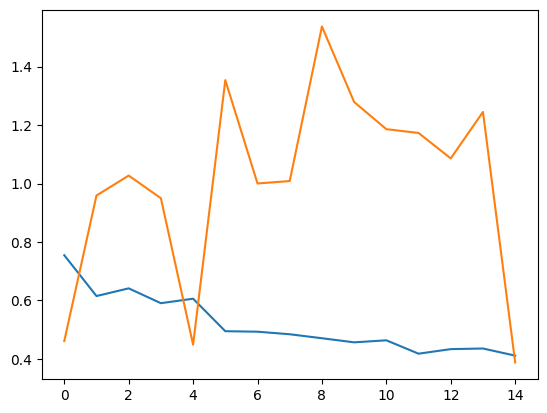

Best model found in Epoch 15........Saving Model
Epoch 16/90, Batch 10/76, Loss: 0.4880
Epoch 16/90, Batch 20/76, Loss: 0.5351
Epoch 16/90, Batch 30/76, Loss: 0.3682
Epoch 16/90, Batch 40/76, Loss: 0.3697
Epoch 16/90, Batch 50/76, Loss: 0.2683
Epoch 16/90, Batch 60/76, Loss: 0.5299
Epoch 16/90, Batch 70/76, Loss: 0.3044
|EPOCH 16| TRAIN_LOSS 0.44385671262678345| VALID_LOSS 0.7472778975963592|


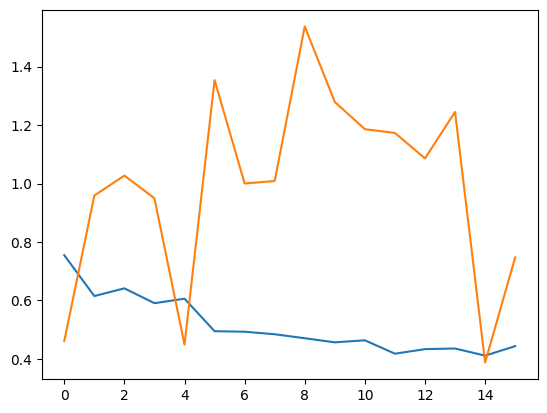

Epoch 17/90, Batch 10/76, Loss: 0.6506
Epoch 17/90, Batch 20/76, Loss: 0.4189
Epoch 17/90, Batch 30/76, Loss: 0.5608
Epoch 17/90, Batch 40/76, Loss: 0.3960
Epoch 17/90, Batch 50/76, Loss: 0.2171
Epoch 17/90, Batch 60/76, Loss: 0.3160
Epoch 17/90, Batch 70/76, Loss: 0.1936
|EPOCH 17| TRAIN_LOSS 0.4629396355073703| VALID_LOSS 0.3751422673463821|


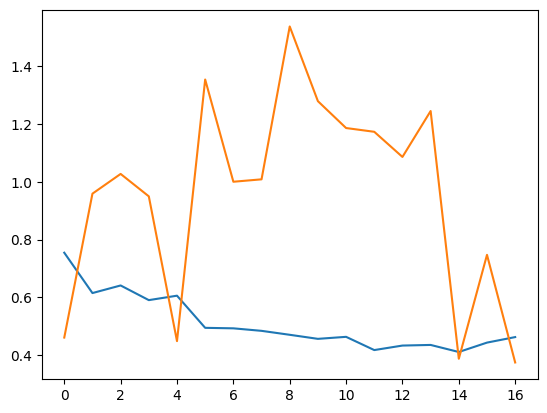

Best model found in Epoch 17........Saving Model
Epoch 18/90, Batch 10/76, Loss: 0.2549
Epoch 18/90, Batch 20/76, Loss: 0.4665
Epoch 18/90, Batch 30/76, Loss: 0.2982
Epoch 18/90, Batch 40/76, Loss: 0.3063
Epoch 18/90, Batch 50/76, Loss: 0.4257
Epoch 18/90, Batch 60/76, Loss: 0.7561
Epoch 18/90, Batch 70/76, Loss: 0.3732
|EPOCH 18| TRAIN_LOSS 0.4643728776197684| VALID_LOSS 0.45320813059806825|


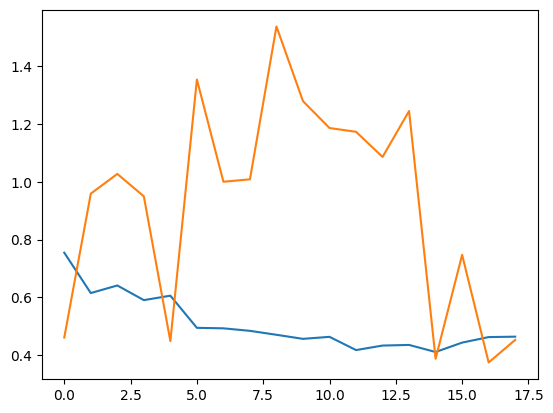

Epoch 19/90, Batch 10/76, Loss: 0.6837
Epoch 19/90, Batch 20/76, Loss: 0.5495
Epoch 19/90, Batch 30/76, Loss: 0.1563
Epoch 19/90, Batch 40/76, Loss: 0.3684
Epoch 19/90, Batch 50/76, Loss: 0.3846
Epoch 19/90, Batch 60/76, Loss: 0.5803
Epoch 19/90, Batch 70/76, Loss: 0.3632
|EPOCH 19| TRAIN_LOSS 0.46523878929254253| VALID_LOSS 0.36097843448321026|


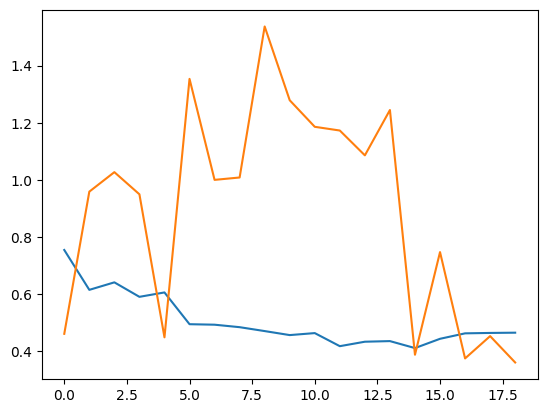

Best model found in Epoch 19........Saving Model
Epoch 20/90, Batch 10/76, Loss: 0.7113
Epoch 20/90, Batch 20/76, Loss: 0.6415
Epoch 20/90, Batch 30/76, Loss: 0.5310
Epoch 20/90, Batch 40/76, Loss: 0.5743
Epoch 20/90, Batch 50/76, Loss: 0.7360
Epoch 20/90, Batch 60/76, Loss: 0.3624
Epoch 20/90, Batch 70/76, Loss: 0.2832
|EPOCH 20| TRAIN_LOSS 0.5911803443573023| VALID_LOSS 0.5681155463059743|


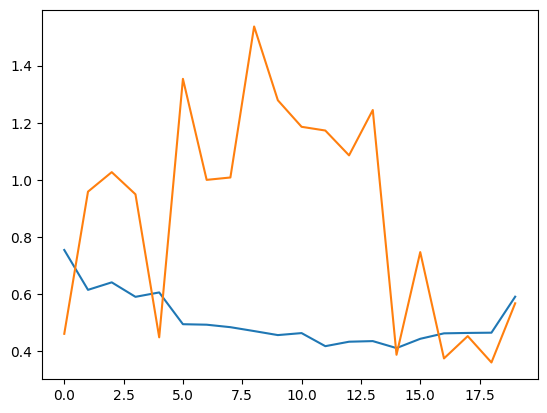

Epoch 21/90, Batch 10/76, Loss: 0.4836
Epoch 21/90, Batch 20/76, Loss: 0.3746
Epoch 21/90, Batch 30/76, Loss: 0.2434
Epoch 21/90, Batch 40/76, Loss: 0.3979
Epoch 21/90, Batch 50/76, Loss: 0.8341
Epoch 21/90, Batch 60/76, Loss: 0.4561
Epoch 21/90, Batch 70/76, Loss: 0.1868
|EPOCH 21| TRAIN_LOSS 0.4896719112600151| VALID_LOSS 0.9676600019137065|


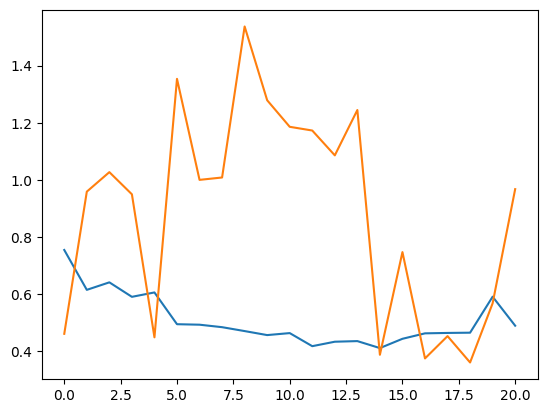

Epoch 22/90, Batch 10/76, Loss: 0.6741
Epoch 22/90, Batch 20/76, Loss: 0.4329
Epoch 22/90, Batch 30/76, Loss: 0.5885
Epoch 22/90, Batch 40/76, Loss: 0.3260
Epoch 22/90, Batch 50/76, Loss: 0.4203
Epoch 22/90, Batch 60/76, Loss: 0.6282
Epoch 22/90, Batch 70/76, Loss: 0.2917
|EPOCH 22| TRAIN_LOSS 0.5255956836044788| VALID_LOSS 0.3604636361201604|


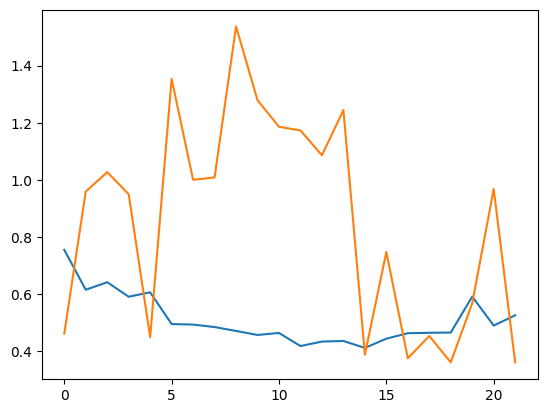

Best model found in Epoch 22........Saving Model
Epoch 23/90, Batch 10/76, Loss: 0.3474
Epoch 23/90, Batch 20/76, Loss: 0.5598
Epoch 23/90, Batch 30/76, Loss: 0.5894
Epoch 23/90, Batch 40/76, Loss: 0.4238
Epoch 23/90, Batch 50/76, Loss: 0.8371
Epoch 23/90, Batch 60/76, Loss: 0.4916
Epoch 23/90, Batch 70/76, Loss: 0.4935
|EPOCH 23| TRAIN_LOSS 0.531247149564718| VALID_LOSS 0.37808591524759927|


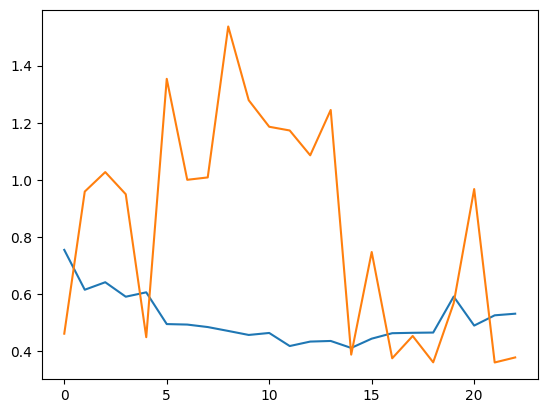

Epoch 24/90, Batch 10/76, Loss: 0.2734
Epoch 24/90, Batch 20/76, Loss: 1.1990
Epoch 24/90, Batch 30/76, Loss: 0.6758
Epoch 24/90, Batch 40/76, Loss: 0.2964
Epoch 24/90, Batch 50/76, Loss: 0.5697
Epoch 24/90, Batch 60/76, Loss: 0.3927
Epoch 24/90, Batch 70/76, Loss: 0.6532
|EPOCH 24| TRAIN_LOSS 0.47445005511766986| VALID_LOSS 0.6300644238789876|


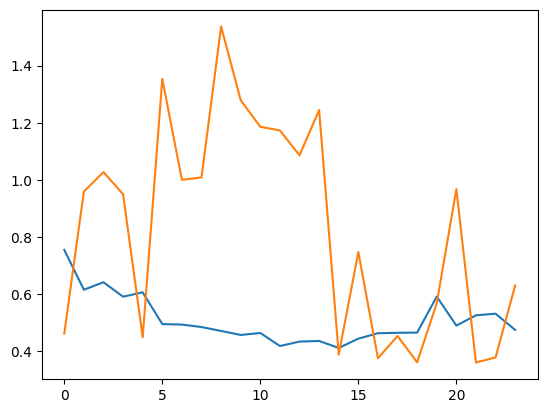

Epoch 25/90, Batch 10/76, Loss: 0.6725
Epoch 25/90, Batch 20/76, Loss: 0.2250
Epoch 25/90, Batch 30/76, Loss: 0.6236
Epoch 25/90, Batch 40/76, Loss: 0.2597
Epoch 25/90, Batch 50/76, Loss: 0.3399
Epoch 25/90, Batch 60/76, Loss: 0.5141
Epoch 25/90, Batch 70/76, Loss: 0.3421
|EPOCH 25| TRAIN_LOSS 0.5181291989589992| VALID_LOSS 0.4626746714115143|


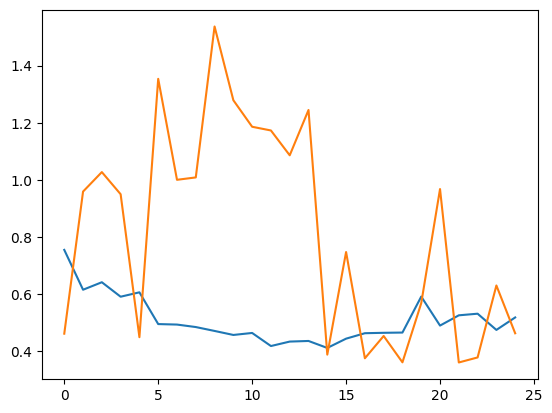

Epoch 26/90, Batch 10/76, Loss: 0.5849
Epoch 26/90, Batch 20/76, Loss: 0.5639
Epoch 26/90, Batch 30/76, Loss: 0.7967
Epoch 26/90, Batch 40/76, Loss: 0.5692
Epoch 26/90, Batch 50/76, Loss: 0.2229
Epoch 26/90, Batch 60/76, Loss: 0.2998
Epoch 26/90, Batch 70/76, Loss: 0.4053
|EPOCH 26| TRAIN_LOSS 0.4899877741148597| VALID_LOSS 0.37605674465497335|


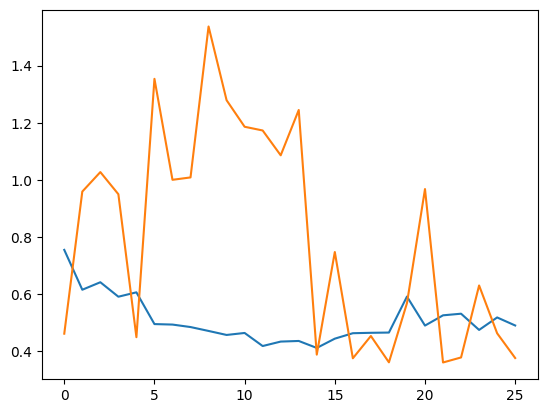

Epoch 27/90, Batch 10/76, Loss: 0.8355
Epoch 27/90, Batch 20/76, Loss: 0.1274
Epoch 27/90, Batch 30/76, Loss: 0.5257
Epoch 27/90, Batch 40/76, Loss: 0.3249
Epoch 27/90, Batch 50/76, Loss: 0.2734
Epoch 27/90, Batch 60/76, Loss: 0.3886
Epoch 27/90, Batch 70/76, Loss: 0.3872
|EPOCH 27| TRAIN_LOSS 0.4788676451303457| VALID_LOSS 0.7111641565958658|


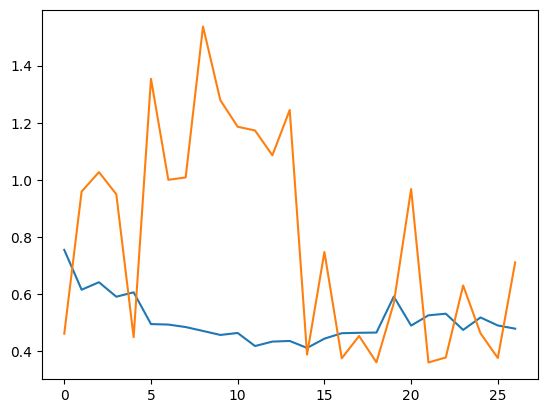

Epoch 28/90, Batch 10/76, Loss: 0.2846
Epoch 28/90, Batch 20/76, Loss: 0.4430
Epoch 28/90, Batch 30/76, Loss: 0.5107
Epoch 28/90, Batch 40/76, Loss: 0.4608
Epoch 28/90, Batch 50/76, Loss: 0.3404
Epoch 28/90, Batch 60/76, Loss: 0.3467
Epoch 28/90, Batch 70/76, Loss: 0.4287
|EPOCH 28| TRAIN_LOSS 0.4704142946161722| VALID_LOSS 0.32472397685050963|


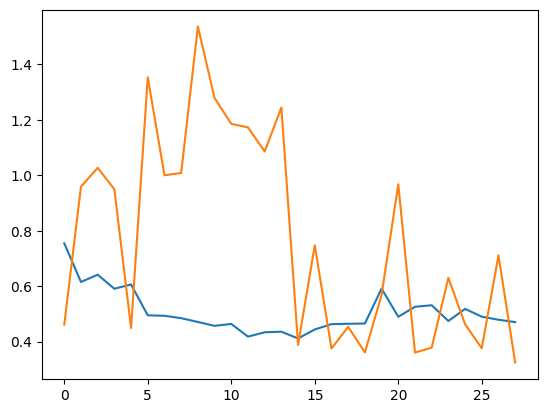

Best model found in Epoch 28........Saving Model
Epoch 29/90, Batch 10/76, Loss: 0.5544
Epoch 29/90, Batch 20/76, Loss: 0.2659
Epoch 29/90, Batch 30/76, Loss: 0.3370
Epoch 29/90, Batch 40/76, Loss: 0.3501
Epoch 29/90, Batch 50/76, Loss: 0.2478
Epoch 29/90, Batch 60/76, Loss: 0.4615
Epoch 29/90, Batch 70/76, Loss: 0.2126
|EPOCH 29| TRAIN_LOSS 0.4632941176624675| VALID_LOSS 0.5918385465939839|


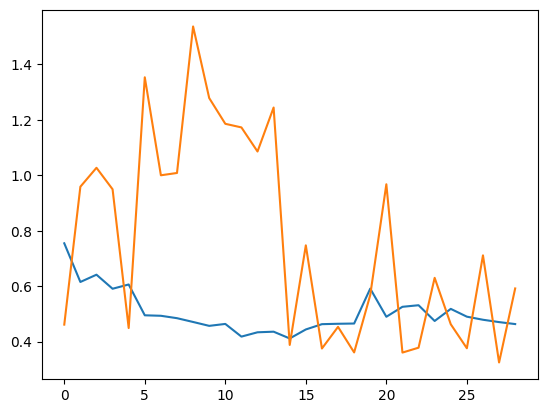

Epoch 30/90, Batch 10/76, Loss: 0.3942
Epoch 30/90, Batch 20/76, Loss: 0.6384
Epoch 30/90, Batch 30/76, Loss: 0.2936
Epoch 30/90, Batch 40/76, Loss: 0.2935
Epoch 30/90, Batch 50/76, Loss: 0.2984
Epoch 30/90, Batch 60/76, Loss: 0.4405
Epoch 30/90, Batch 70/76, Loss: 0.4726
|EPOCH 30| TRAIN_LOSS 0.46642550286885937| VALID_LOSS 0.42137209872404735|


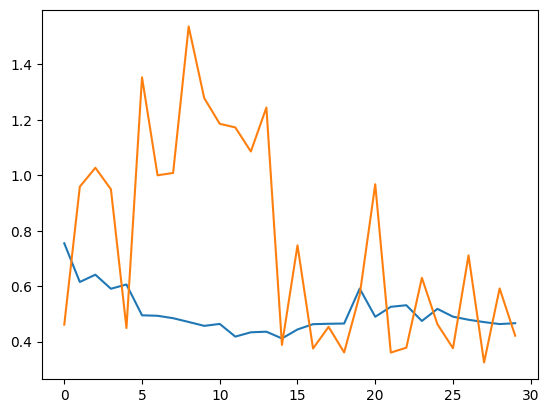

Epoch 31/90, Batch 10/76, Loss: 0.6215
Epoch 31/90, Batch 20/76, Loss: 1.0736
Epoch 31/90, Batch 30/76, Loss: 0.3478
Epoch 31/90, Batch 40/76, Loss: 0.3980
Epoch 31/90, Batch 50/76, Loss: 0.3269
Epoch 31/90, Batch 60/76, Loss: 0.3205
Epoch 31/90, Batch 70/76, Loss: 0.3477
|EPOCH 31| TRAIN_LOSS 0.4525390847733146| VALID_LOSS 0.7385989546775817|


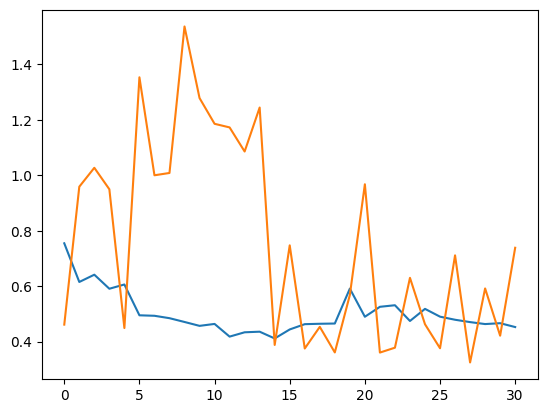

Epoch 32/90, Batch 10/76, Loss: 0.4416
Epoch 32/90, Batch 20/76, Loss: 0.3358
Epoch 32/90, Batch 30/76, Loss: 0.5285
Epoch 32/90, Batch 40/76, Loss: 0.4250
Epoch 32/90, Batch 50/76, Loss: 0.6192
Epoch 32/90, Batch 60/76, Loss: 0.3064
Epoch 32/90, Batch 70/76, Loss: 1.3279
|EPOCH 32| TRAIN_LOSS 0.48202555999159813| VALID_LOSS 0.4267944465080897|


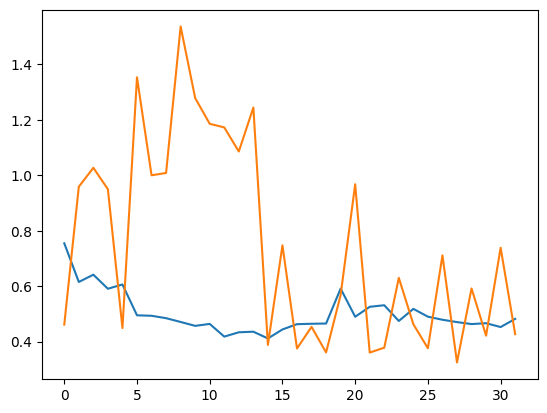

Epoch 33/90, Batch 10/76, Loss: 0.4146
Epoch 33/90, Batch 20/76, Loss: 0.2167
Epoch 33/90, Batch 30/76, Loss: 0.1783
Epoch 33/90, Batch 40/76, Loss: 0.6226
Epoch 33/90, Batch 50/76, Loss: 0.2508
Epoch 33/90, Batch 60/76, Loss: 0.2817
Epoch 33/90, Batch 70/76, Loss: 0.5992
|EPOCH 33| TRAIN_LOSS 0.4727351157680938| VALID_LOSS 0.5467910885810852|


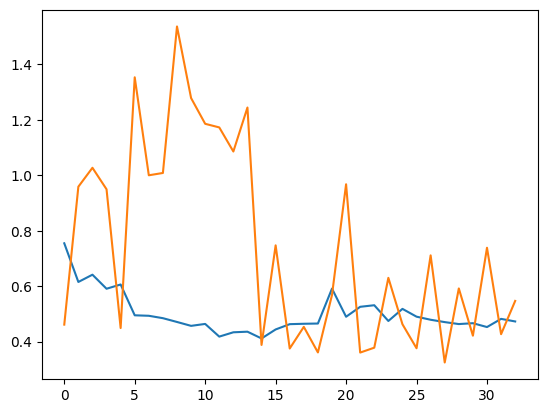

Epoch 34/90, Batch 10/76, Loss: 0.9037
Epoch 34/90, Batch 20/76, Loss: 0.2937
Epoch 34/90, Batch 30/76, Loss: 0.3265
Epoch 34/90, Batch 40/76, Loss: 0.6788
Epoch 34/90, Batch 50/76, Loss: 0.4923
Epoch 34/90, Batch 60/76, Loss: 0.3735
Epoch 34/90, Batch 70/76, Loss: 0.4740
|EPOCH 34| TRAIN_LOSS 0.4402192931034063| VALID_LOSS 0.37690891822179157|


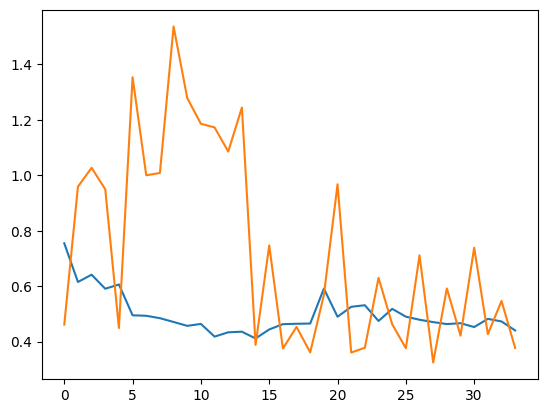

Epoch 35/90, Batch 10/76, Loss: 0.5618
Epoch 35/90, Batch 20/76, Loss: 0.4222
Epoch 35/90, Batch 30/76, Loss: 0.8389
Epoch 35/90, Batch 40/76, Loss: 0.3776
Epoch 35/90, Batch 50/76, Loss: 0.2101
Epoch 35/90, Batch 60/76, Loss: 0.8102
Epoch 35/90, Batch 70/76, Loss: 0.6321
|EPOCH 35| TRAIN_LOSS 0.41685274890378904| VALID_LOSS 0.4276652048031489|


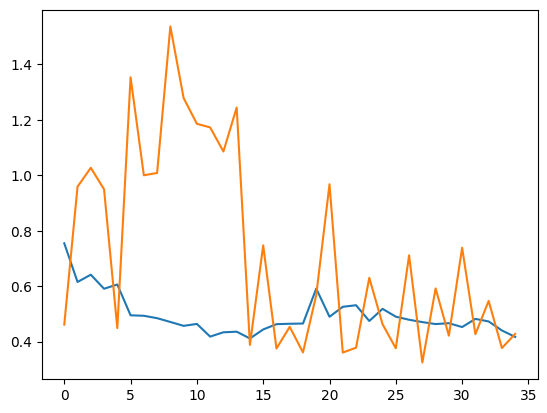

Epoch 36/90, Batch 10/76, Loss: 0.6127
Epoch 36/90, Batch 20/76, Loss: 0.2125
Epoch 36/90, Batch 30/76, Loss: 0.2699
Epoch 36/90, Batch 40/76, Loss: 0.3439
Epoch 36/90, Batch 50/76, Loss: 0.3530
Epoch 36/90, Batch 60/76, Loss: 0.5863
Epoch 36/90, Batch 70/76, Loss: 0.3343
|EPOCH 36| TRAIN_LOSS 0.41895101278236035| VALID_LOSS 0.35310771962006887|


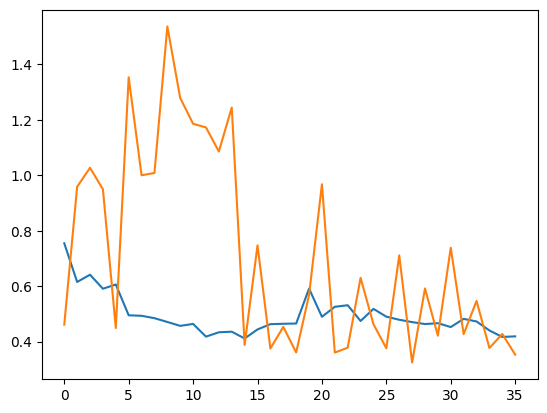

Epoch 37/90, Batch 10/76, Loss: 0.3749
Epoch 37/90, Batch 20/76, Loss: 0.6270
Epoch 37/90, Batch 30/76, Loss: 0.6921
Epoch 37/90, Batch 40/76, Loss: 0.3675
Epoch 37/90, Batch 50/76, Loss: 0.4638
Epoch 37/90, Batch 60/76, Loss: 0.3890
Epoch 37/90, Batch 70/76, Loss: 0.3338
|EPOCH 37| TRAIN_LOSS 0.412360777784335| VALID_LOSS 0.38060359259446463|


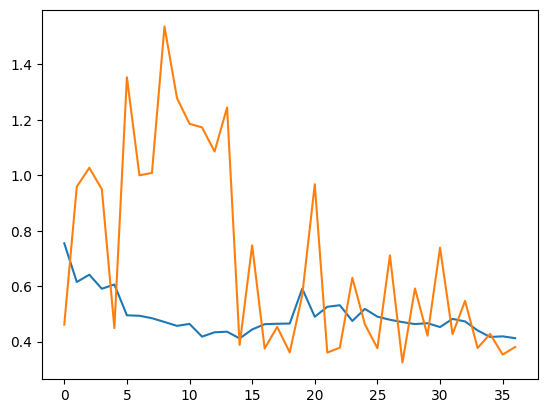

Epoch 38/90, Batch 10/76, Loss: 0.2227
Epoch 38/90, Batch 20/76, Loss: 0.2432
Epoch 38/90, Batch 30/76, Loss: 0.1538
Epoch 38/90, Batch 40/76, Loss: 0.6144
Epoch 38/90, Batch 50/76, Loss: 0.2873
Epoch 38/90, Batch 60/76, Loss: 0.5335
Epoch 38/90, Batch 70/76, Loss: 0.2710
|EPOCH 38| TRAIN_LOSS 0.41361463364017637| VALID_LOSS 0.6238729079564412|


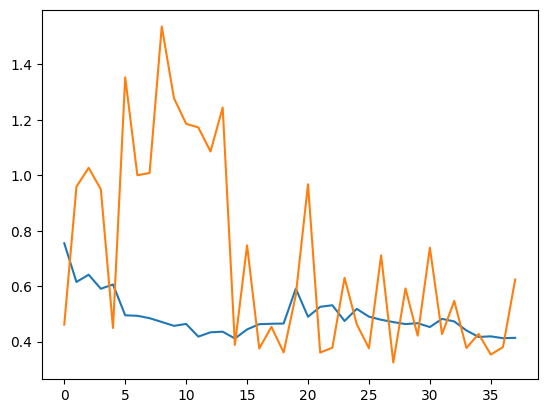

Epoch 39/90, Batch 10/76, Loss: 0.7657
Epoch 39/90, Batch 20/76, Loss: 0.2382
Epoch 39/90, Batch 30/76, Loss: 0.3110
Epoch 39/90, Batch 40/76, Loss: 0.3124
Epoch 39/90, Batch 50/76, Loss: 0.2359
Epoch 39/90, Batch 60/76, Loss: 0.4210
Epoch 39/90, Batch 70/76, Loss: 0.6631
|EPOCH 39| TRAIN_LOSS 0.4108306257740447| VALID_LOSS 1.4985719919204712|


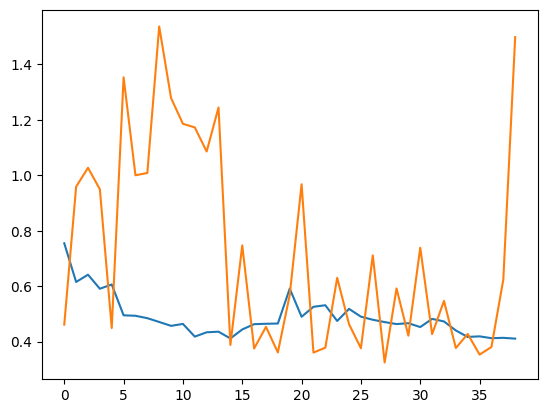

Epoch 40/90, Batch 10/76, Loss: 0.3623
Epoch 40/90, Batch 20/76, Loss: 0.4109
Epoch 40/90, Batch 30/76, Loss: 0.3359
Epoch 40/90, Batch 40/76, Loss: 0.6788
Epoch 40/90, Batch 50/76, Loss: 0.5818
Epoch 40/90, Batch 60/76, Loss: 0.3526
Epoch 40/90, Batch 70/76, Loss: 0.4775
|EPOCH 40| TRAIN_LOSS 0.5337108177574057| VALID_LOSS 1.5831536372502646|


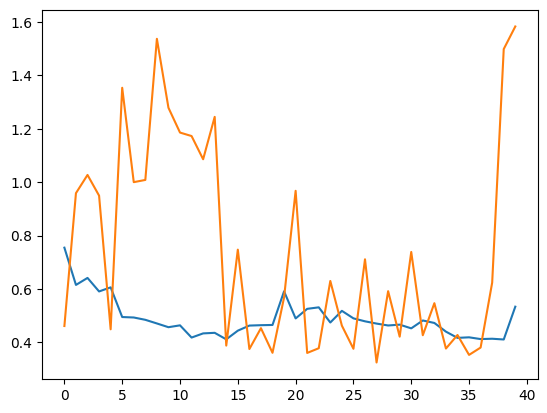

Epoch 41/90, Batch 10/76, Loss: 0.4285
Epoch 41/90, Batch 20/76, Loss: 0.8072
Epoch 41/90, Batch 30/76, Loss: 0.4060
Epoch 41/90, Batch 40/76, Loss: 0.6828
Epoch 41/90, Batch 50/76, Loss: 0.4246
Epoch 41/90, Batch 60/76, Loss: 0.2690
Epoch 41/90, Batch 70/76, Loss: 0.5401
|EPOCH 41| TRAIN_LOSS 0.5291395891261729| VALID_LOSS 1.522783621152242|


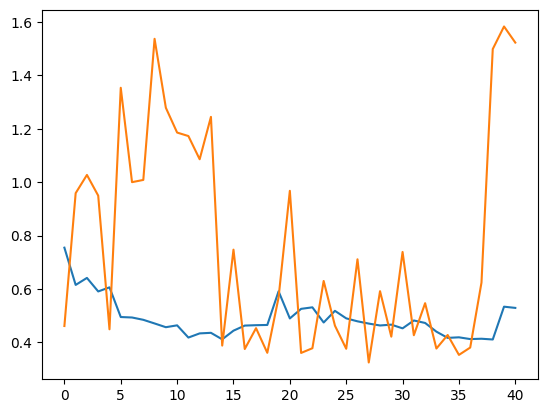

Epoch 42/90, Batch 10/76, Loss: 0.9473
Epoch 42/90, Batch 20/76, Loss: 0.2335
Epoch 42/90, Batch 30/76, Loss: 0.3730
Epoch 42/90, Batch 40/76, Loss: 0.3252
Epoch 42/90, Batch 50/76, Loss: 0.8088
Epoch 42/90, Batch 60/76, Loss: 0.4134
Epoch 42/90, Batch 70/76, Loss: 0.2584
|EPOCH 42| TRAIN_LOSS 0.4225836990303115| VALID_LOSS 0.6684696714083354|


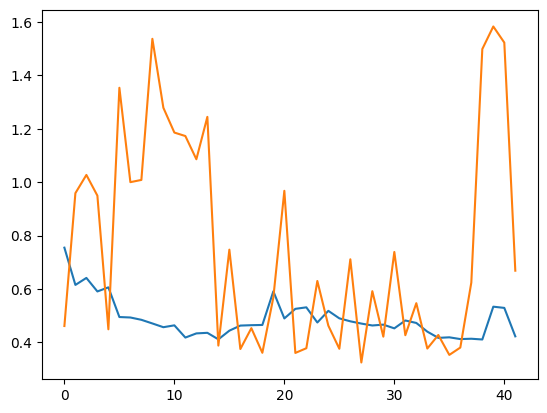

Epoch 43/90, Batch 10/76, Loss: 0.2594
Epoch 43/90, Batch 20/76, Loss: 0.2718
Epoch 43/90, Batch 30/76, Loss: 0.8927
Epoch 43/90, Batch 40/76, Loss: 0.6223
Epoch 43/90, Batch 50/76, Loss: 0.4495
Epoch 43/90, Batch 60/76, Loss: 0.3083
Epoch 43/90, Batch 70/76, Loss: 0.3734
|EPOCH 43| TRAIN_LOSS 0.42557136400749807| VALID_LOSS 1.2044727404912312|


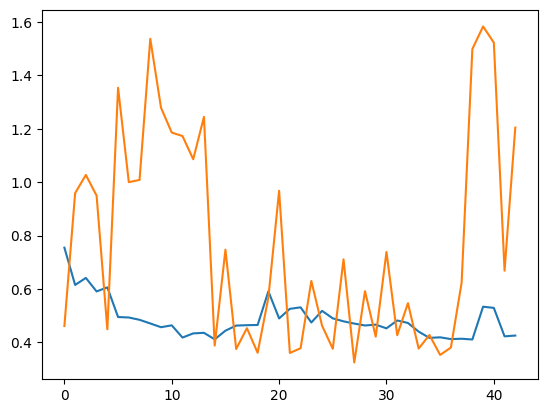

Epoch 44/90, Batch 10/76, Loss: 0.4331
Epoch 44/90, Batch 20/76, Loss: 0.3984
Epoch 44/90, Batch 30/76, Loss: 0.7724
Epoch 44/90, Batch 40/76, Loss: 0.5840
Epoch 44/90, Batch 50/76, Loss: 0.5757
Epoch 44/90, Batch 60/76, Loss: 0.5395
Epoch 44/90, Batch 70/76, Loss: 0.4552
|EPOCH 44| TRAIN_LOSS 0.43285028793309865| VALID_LOSS 1.3761303385098775|


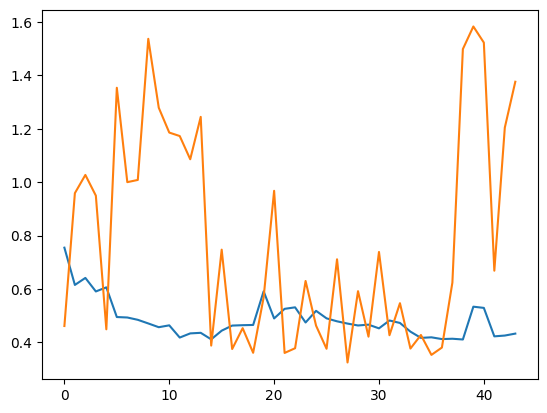

Epoch 45/90, Batch 10/76, Loss: 0.3118
Epoch 45/90, Batch 20/76, Loss: 0.5913
Epoch 45/90, Batch 30/76, Loss: 0.2996
Epoch 45/90, Batch 40/76, Loss: 0.3306
Epoch 45/90, Batch 50/76, Loss: 0.7023
Epoch 45/90, Batch 60/76, Loss: 0.7008
Epoch 45/90, Batch 70/76, Loss: 0.7390
|EPOCH 45| TRAIN_LOSS 0.4192650238738248| VALID_LOSS 0.9506954868634542|


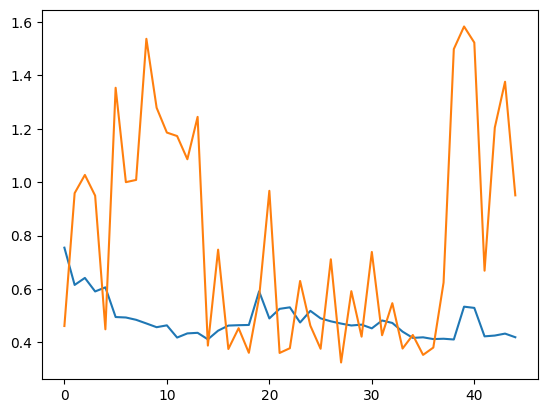

Epoch 46/90, Batch 10/76, Loss: 0.6126
Epoch 46/90, Batch 20/76, Loss: 0.3637
Epoch 46/90, Batch 30/76, Loss: 0.4755
Epoch 46/90, Batch 40/76, Loss: 0.2439
Epoch 46/90, Batch 50/76, Loss: 0.2895
Epoch 46/90, Batch 60/76, Loss: 0.5866
Epoch 46/90, Batch 70/76, Loss: 0.5263
|EPOCH 46| TRAIN_LOSS 0.4186463669726723| VALID_LOSS 1.336706280708313|


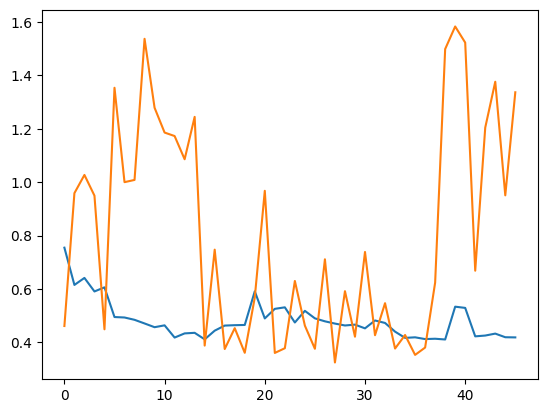

Epoch 47/90, Batch 10/76, Loss: 0.6221
Epoch 47/90, Batch 20/76, Loss: 0.3393
Epoch 47/90, Batch 30/76, Loss: 0.3673
Epoch 47/90, Batch 40/76, Loss: 0.4845
Epoch 47/90, Batch 50/76, Loss: 0.5057
Epoch 47/90, Batch 60/76, Loss: 0.4142
Epoch 47/90, Batch 70/76, Loss: 0.3591
|EPOCH 47| TRAIN_LOSS 0.42136528558636965| VALID_LOSS 1.315444254875183|


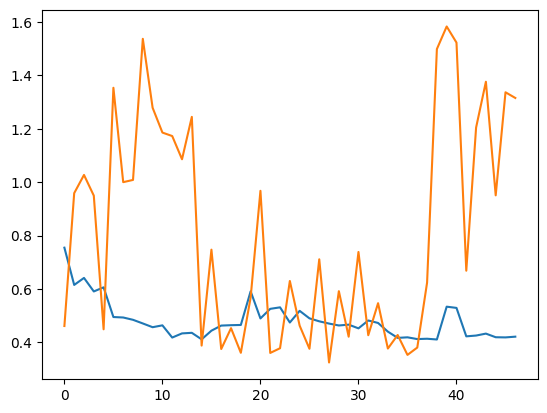

Epoch 48/90, Batch 10/76, Loss: 0.3833
Epoch 48/90, Batch 20/76, Loss: 0.6137
Epoch 48/90, Batch 30/76, Loss: 0.1966
Epoch 48/90, Batch 40/76, Loss: 0.2060
Epoch 48/90, Batch 50/76, Loss: 0.4331
Epoch 48/90, Batch 60/76, Loss: 0.3224
Epoch 48/90, Batch 70/76, Loss: 0.7878
|EPOCH 48| TRAIN_LOSS 0.44508511592683037| VALID_LOSS 1.2855110843976338|


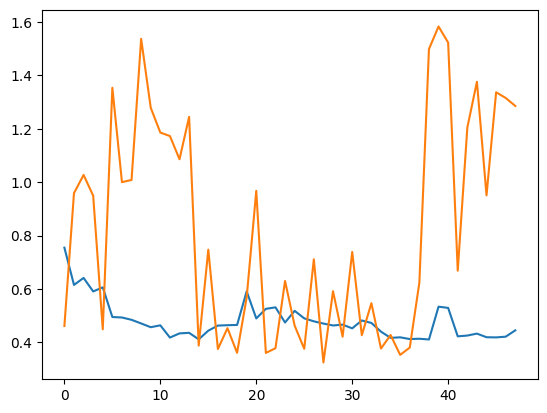

Epoch 49/90, Batch 10/76, Loss: 0.2272
Epoch 49/90, Batch 20/76, Loss: 0.4232
Epoch 49/90, Batch 30/76, Loss: 0.7792
Epoch 49/90, Batch 40/76, Loss: 0.4479
Epoch 49/90, Batch 50/76, Loss: 0.3779
Epoch 49/90, Batch 60/76, Loss: 0.2065
Epoch 49/90, Batch 70/76, Loss: 0.2234
|EPOCH 49| TRAIN_LOSS 0.4204383661088191| VALID_LOSS 1.0420228600502015|


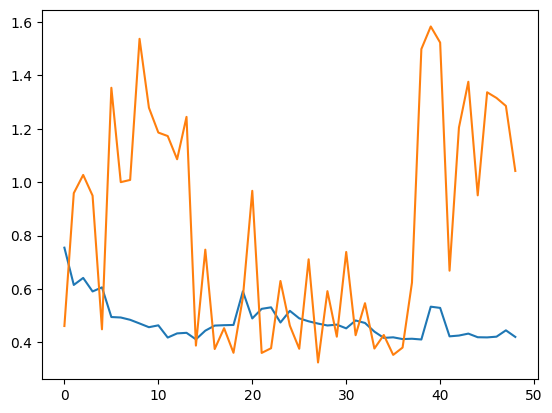

Epoch 50/90, Batch 10/76, Loss: 0.6291
Epoch 50/90, Batch 20/76, Loss: 0.2796
Epoch 50/90, Batch 30/76, Loss: 0.2912
Epoch 50/90, Batch 40/76, Loss: 0.5040
Epoch 50/90, Batch 50/76, Loss: 0.3679
Epoch 50/90, Batch 60/76, Loss: 0.6284
Epoch 50/90, Batch 70/76, Loss: 0.3310
|EPOCH 50| TRAIN_LOSS 0.44205852872446966| VALID_LOSS 0.7177858372529348|


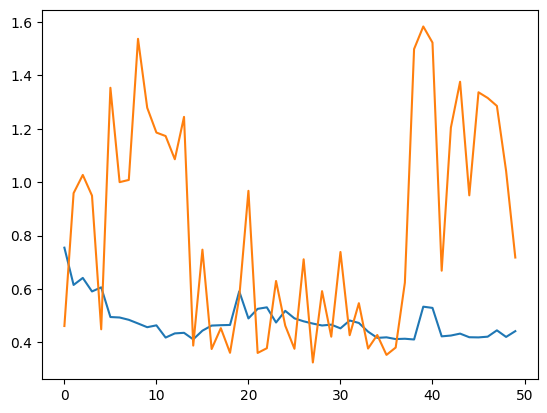

Epoch 51/90, Batch 10/76, Loss: 0.4131
Epoch 51/90, Batch 20/76, Loss: 0.1635
Epoch 51/90, Batch 30/76, Loss: 0.3788
Epoch 51/90, Batch 40/76, Loss: 0.3005
Epoch 51/90, Batch 50/76, Loss: 0.5125
Epoch 51/90, Batch 60/76, Loss: 0.3690
Epoch 51/90, Batch 70/76, Loss: 0.2194
|EPOCH 51| TRAIN_LOSS 0.4377820203570943| VALID_LOSS 0.9659159262975057|


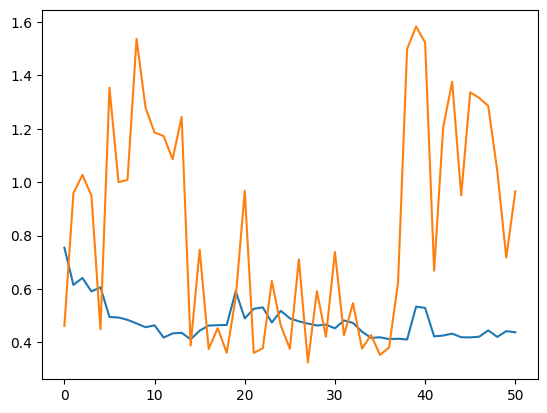

Epoch 52/90, Batch 10/76, Loss: 0.3895
Epoch 52/90, Batch 20/76, Loss: 0.2771
Epoch 52/90, Batch 30/76, Loss: 0.3976
Epoch 52/90, Batch 40/76, Loss: 0.4883
Epoch 52/90, Batch 50/76, Loss: 0.4543
Epoch 52/90, Batch 60/76, Loss: 0.2440
Epoch 52/90, Batch 70/76, Loss: 0.5672
|EPOCH 52| TRAIN_LOSS 0.45812709845210375| VALID_LOSS 0.8320032149553299|


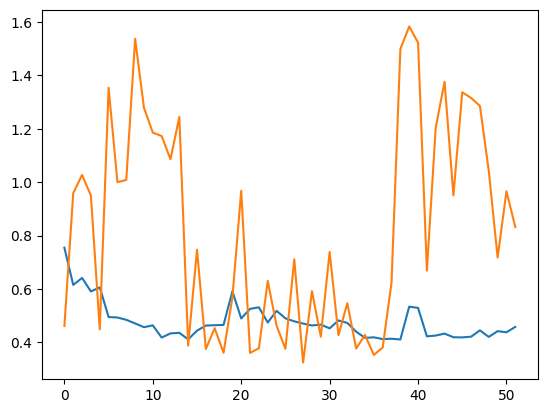

Epoch 53/90, Batch 10/76, Loss: 0.4316
Epoch 53/90, Batch 20/76, Loss: 0.6045
Epoch 53/90, Batch 30/76, Loss: 0.4680
Epoch 53/90, Batch 40/76, Loss: 0.3263
Epoch 53/90, Batch 50/76, Loss: 0.2637
Epoch 53/90, Batch 60/76, Loss: 0.5413
Epoch 53/90, Batch 70/76, Loss: 0.4400
|EPOCH 53| TRAIN_LOSS 0.42088823255739716| VALID_LOSS 0.7887411117553711|


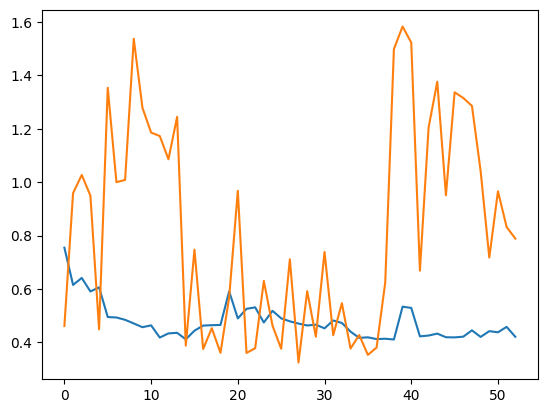

Epoch 54/90, Batch 10/76, Loss: 0.4759
Epoch 54/90, Batch 20/76, Loss: 0.5143
Epoch 54/90, Batch 30/76, Loss: 0.1468
Epoch 54/90, Batch 40/76, Loss: 0.3615
Epoch 54/90, Batch 50/76, Loss: 0.5122
Epoch 54/90, Batch 60/76, Loss: 0.1987
Epoch 54/90, Batch 70/76, Loss: 0.1485
|EPOCH 54| TRAIN_LOSS 0.4769032826941264| VALID_LOSS 0.6944160381952922|


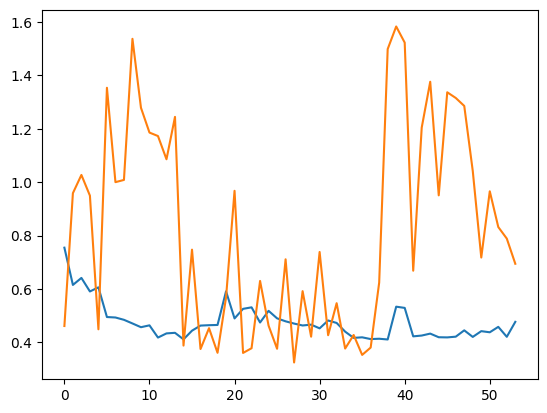

Epoch 55/90, Batch 10/76, Loss: 0.6076
Epoch 55/90, Batch 20/76, Loss: 0.4042
Epoch 55/90, Batch 30/76, Loss: 0.4307
Epoch 55/90, Batch 40/76, Loss: 0.3372
Epoch 55/90, Batch 50/76, Loss: 0.7156
Epoch 55/90, Batch 60/76, Loss: 0.2143
Epoch 55/90, Batch 70/76, Loss: 0.2832
|EPOCH 55| TRAIN_LOSS 0.4128616301244811| VALID_LOSS 0.34094460209210714|


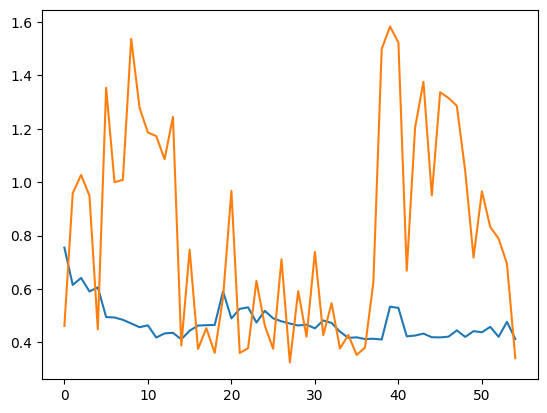

Epoch 56/90, Batch 10/76, Loss: 0.3934
Epoch 56/90, Batch 20/76, Loss: 0.2841
Epoch 56/90, Batch 30/76, Loss: 0.5765
Epoch 56/90, Batch 40/76, Loss: 0.7240
Epoch 56/90, Batch 50/76, Loss: 0.4390
Epoch 56/90, Batch 60/76, Loss: 0.6890
Epoch 56/90, Batch 70/76, Loss: 0.3842
|EPOCH 56| TRAIN_LOSS 0.4422754527706849| VALID_LOSS 0.7855394045511882|


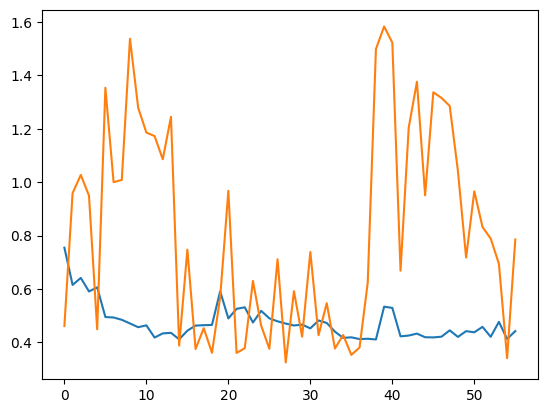

Epoch 57/90, Batch 10/76, Loss: 0.4447
Epoch 57/90, Batch 20/76, Loss: 0.4299
Epoch 57/90, Batch 30/76, Loss: 0.5095
Epoch 57/90, Batch 40/76, Loss: 0.3352
Epoch 57/90, Batch 50/76, Loss: 0.4115
Epoch 57/90, Batch 60/76, Loss: 0.5511
Epoch 57/90, Batch 70/76, Loss: 0.2125
|EPOCH 57| TRAIN_LOSS 0.43051882892062787| VALID_LOSS 0.34038634995619454|


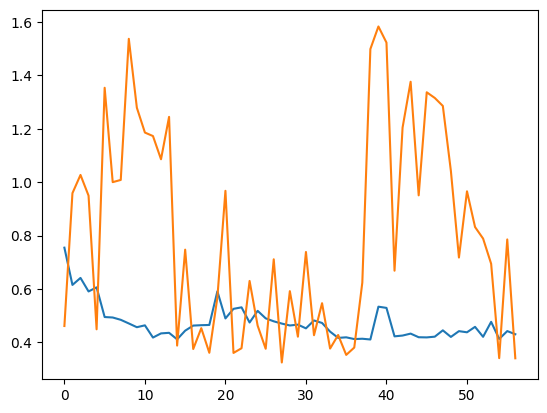

Epoch 58/90, Batch 10/76, Loss: 0.1969
Epoch 58/90, Batch 20/76, Loss: 0.2973
Epoch 58/90, Batch 30/76, Loss: 0.1756
Epoch 58/90, Batch 40/76, Loss: 0.3812
Epoch 58/90, Batch 50/76, Loss: 0.9427
Epoch 58/90, Batch 60/76, Loss: 0.2231
Epoch 58/90, Batch 70/76, Loss: 0.2751
|EPOCH 58| TRAIN_LOSS 0.4251478708496219| VALID_LOSS 0.7966227193673452|


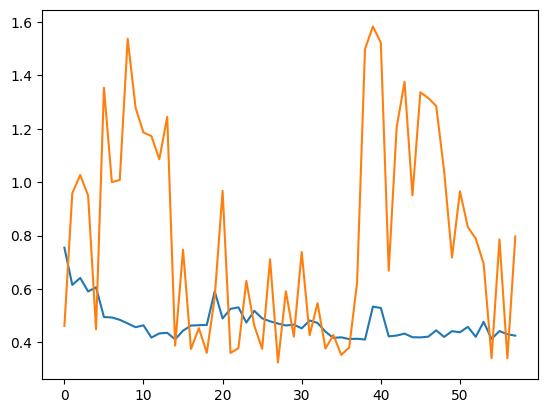

Epoch 59/90, Batch 10/76, Loss: 0.3250
Epoch 59/90, Batch 20/76, Loss: 0.3395
Epoch 59/90, Batch 30/76, Loss: 0.4714
Epoch 59/90, Batch 40/76, Loss: 0.6474
Epoch 59/90, Batch 50/76, Loss: 0.2803
Epoch 59/90, Batch 60/76, Loss: 0.6747
Epoch 59/90, Batch 70/76, Loss: 0.4478
|EPOCH 59| TRAIN_LOSS 0.42820386059190096| VALID_LOSS 0.8999394555886586|


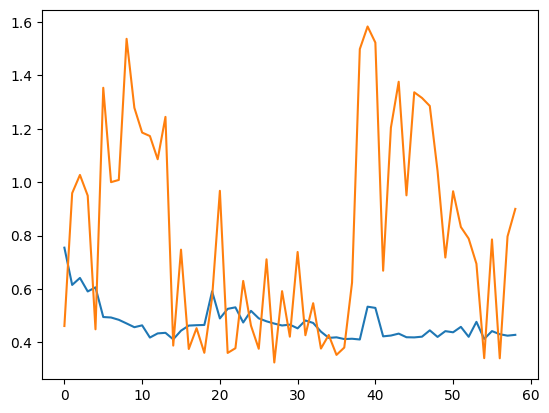

Epoch 60/90, Batch 10/76, Loss: 0.3124
Epoch 60/90, Batch 20/76, Loss: 0.2173
Epoch 60/90, Batch 30/76, Loss: 0.3063
Epoch 60/90, Batch 40/76, Loss: 0.1878
Epoch 60/90, Batch 50/76, Loss: 0.7319
Epoch 60/90, Batch 60/76, Loss: 0.2972
Epoch 60/90, Batch 70/76, Loss: 0.5543
|EPOCH 60| TRAIN_LOSS 0.40695467061902346| VALID_LOSS 1.141646158695221|


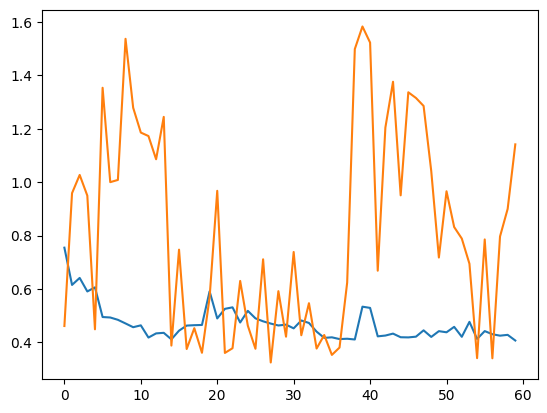

Epoch 61/90, Batch 10/76, Loss: 0.3945
Epoch 61/90, Batch 20/76, Loss: 0.7147
Epoch 61/90, Batch 30/76, Loss: 0.2006
Epoch 61/90, Batch 40/76, Loss: 0.9844
Epoch 61/90, Batch 50/76, Loss: 0.2511
Epoch 61/90, Batch 60/76, Loss: 0.2915
Epoch 61/90, Batch 70/76, Loss: 0.4291
|EPOCH 61| TRAIN_LOSS 0.41932530524699313| VALID_LOSS 1.3392637968063354|


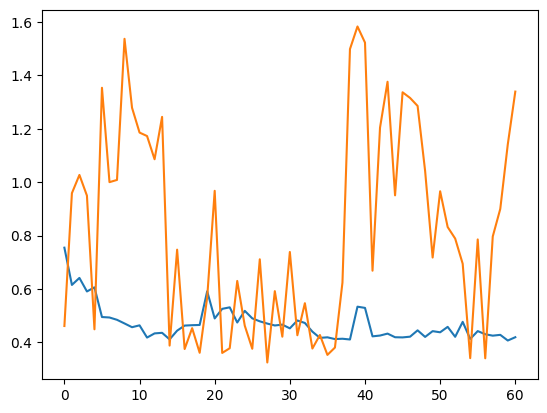

Epoch 62/90, Batch 10/76, Loss: 0.2660
Epoch 62/90, Batch 20/76, Loss: 0.4571
Epoch 62/90, Batch 30/76, Loss: 0.4344
Epoch 62/90, Batch 40/76, Loss: 0.6471
Epoch 62/90, Batch 50/76, Loss: 0.2951
Epoch 62/90, Batch 60/76, Loss: 0.4237
Epoch 62/90, Batch 70/76, Loss: 0.3139
|EPOCH 62| TRAIN_LOSS 0.423966355033611| VALID_LOSS 0.9054076453049977|


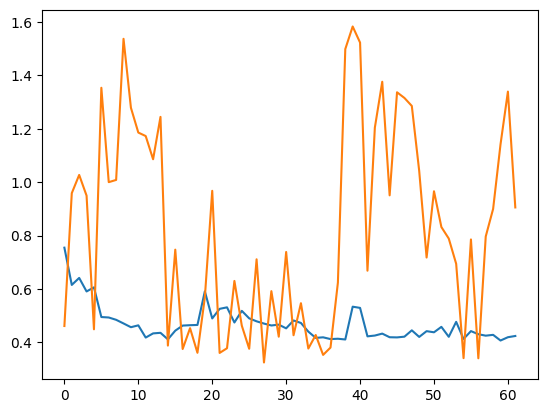

Epoch 63/90, Batch 10/76, Loss: 0.2130
Epoch 63/90, Batch 20/76, Loss: 0.2652
Epoch 63/90, Batch 30/76, Loss: 0.3434
Epoch 63/90, Batch 40/76, Loss: 0.4937
Epoch 63/90, Batch 50/76, Loss: 0.4955
Epoch 63/90, Batch 60/76, Loss: 0.4463
Epoch 63/90, Batch 70/76, Loss: 0.4562
|EPOCH 63| TRAIN_LOSS 0.4097516752387348| VALID_LOSS 0.821209438641866|


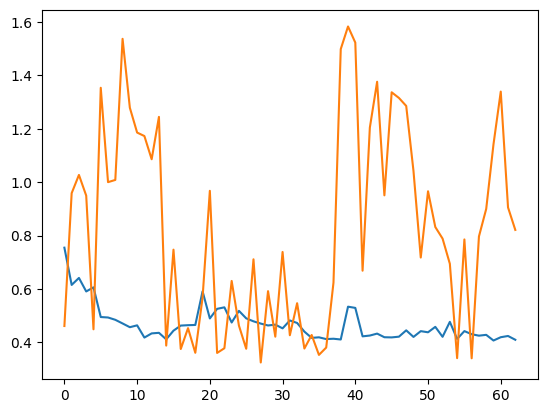

Epoch 64/90, Batch 10/76, Loss: 0.3528
Epoch 64/90, Batch 20/76, Loss: 0.4017
Epoch 64/90, Batch 30/76, Loss: 0.5892
Epoch 64/90, Batch 40/76, Loss: 0.9818
Epoch 64/90, Batch 50/76, Loss: 0.3239
Epoch 64/90, Batch 60/76, Loss: 0.5091
Epoch 64/90, Batch 70/76, Loss: 0.6031
|EPOCH 64| TRAIN_LOSS 0.4076667563303521| VALID_LOSS 0.9949841499328613|


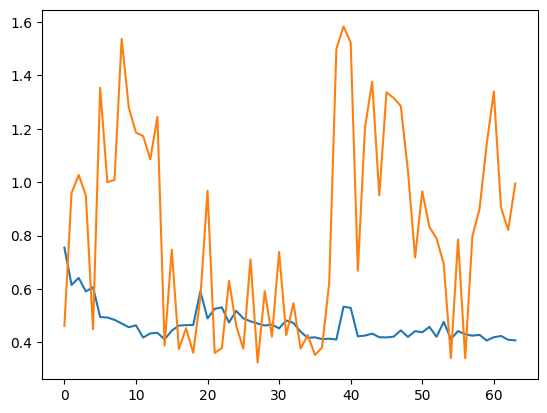

Epoch 65/90, Batch 10/76, Loss: 0.2984
Epoch 65/90, Batch 20/76, Loss: 0.3849
Epoch 65/90, Batch 30/76, Loss: 0.4240
Epoch 65/90, Batch 40/76, Loss: 0.3733
Epoch 65/90, Batch 50/76, Loss: 0.2860
Epoch 65/90, Batch 60/76, Loss: 0.3449
Epoch 65/90, Batch 70/76, Loss: 0.5360
|EPOCH 65| TRAIN_LOSS 0.41172453565032857| VALID_LOSS 2.1723909616470336|


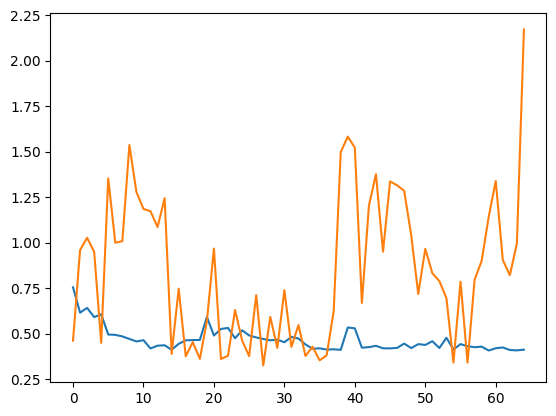

Epoch 66/90, Batch 10/76, Loss: 0.4962
Epoch 66/90, Batch 20/76, Loss: 0.1714
Epoch 66/90, Batch 30/76, Loss: 0.5980
Epoch 66/90, Batch 40/76, Loss: 0.4632
Epoch 66/90, Batch 50/76, Loss: 0.3382
Epoch 66/90, Batch 60/76, Loss: 0.3944
Epoch 66/90, Batch 70/76, Loss: 0.4497
|EPOCH 66| TRAIN_LOSS 0.42304876250656026| VALID_LOSS 1.6662073453267416|


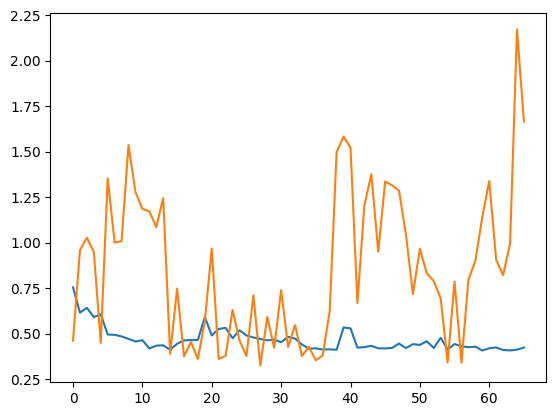

Epoch 67/90, Batch 10/76, Loss: 0.3042
Epoch 67/90, Batch 20/76, Loss: 0.2936
Epoch 67/90, Batch 30/76, Loss: 0.3715
Epoch 67/90, Batch 40/76, Loss: 0.3080
Epoch 67/90, Batch 50/76, Loss: 0.4999
Epoch 67/90, Batch 60/76, Loss: 0.6103
Epoch 67/90, Batch 70/76, Loss: 0.1753
|EPOCH 67| TRAIN_LOSS 0.3958251486091237| VALID_LOSS 1.0199792544047037|


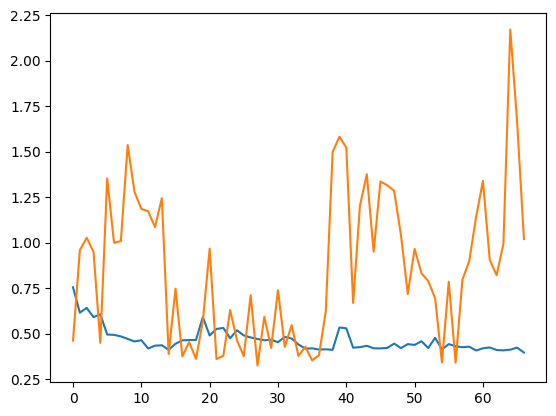

Epoch 68/90, Batch 10/76, Loss: 0.4067
Epoch 68/90, Batch 20/76, Loss: 0.4838
Epoch 68/90, Batch 30/76, Loss: 0.6077
Epoch 68/90, Batch 40/76, Loss: 0.4389
Epoch 68/90, Batch 50/76, Loss: 0.3645
Epoch 68/90, Batch 60/76, Loss: 0.1020
Epoch 68/90, Batch 70/76, Loss: 0.3053
|EPOCH 68| TRAIN_LOSS 0.41639419174508047| VALID_LOSS 1.4480053663253785|


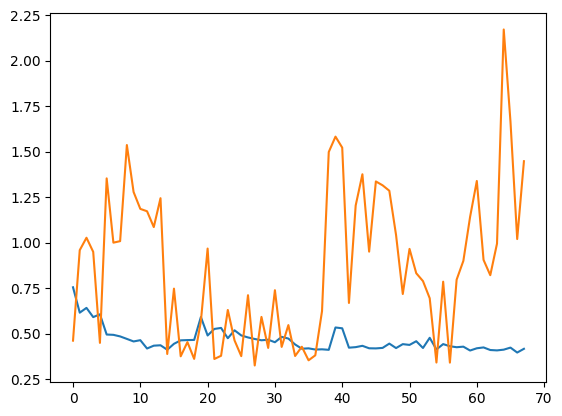

Epoch 69/90, Batch 10/76, Loss: 0.3409
Epoch 69/90, Batch 20/76, Loss: 0.2977
Epoch 69/90, Batch 30/76, Loss: 0.5609
Epoch 69/90, Batch 40/76, Loss: 0.6383
Epoch 69/90, Batch 50/76, Loss: 0.8162
Epoch 69/90, Batch 60/76, Loss: 0.2996
Epoch 69/90, Batch 70/76, Loss: 0.1879
|EPOCH 69| TRAIN_LOSS 0.4379467147549516| VALID_LOSS 1.1678971648216248|


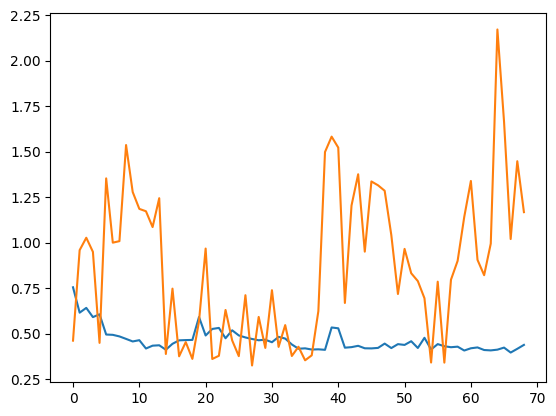

Epoch 70/90, Batch 10/76, Loss: 0.3083
Epoch 70/90, Batch 20/76, Loss: 0.5513
Epoch 70/90, Batch 30/76, Loss: 0.3316
Epoch 70/90, Batch 40/76, Loss: 0.4236
Epoch 70/90, Batch 50/76, Loss: 0.5599
Epoch 70/90, Batch 60/76, Loss: 0.2498
Epoch 70/90, Batch 70/76, Loss: 0.5011
|EPOCH 70| TRAIN_LOSS 0.42586710872618777| VALID_LOSS 0.7119299312432606|


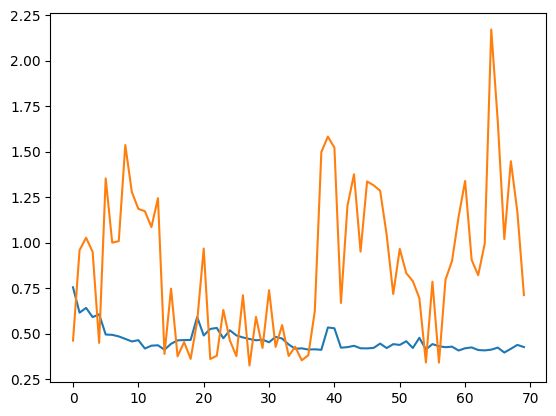

Epoch 71/90, Batch 10/76, Loss: 0.1222
Epoch 71/90, Batch 20/76, Loss: 0.3474
Epoch 71/90, Batch 30/76, Loss: 0.7142
Epoch 71/90, Batch 40/76, Loss: 0.2125
Epoch 71/90, Batch 50/76, Loss: 0.5501
Epoch 71/90, Batch 60/76, Loss: 0.5593
Epoch 71/90, Batch 70/76, Loss: 0.1719
|EPOCH 71| TRAIN_LOSS 0.40855922295074715| VALID_LOSS 0.6085218191146851|


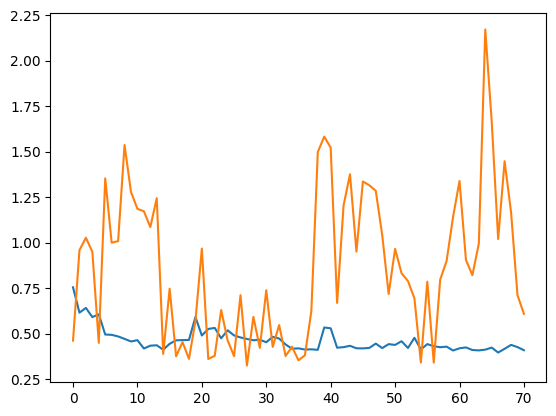

Epoch 72/90, Batch 10/76, Loss: 0.2903
Epoch 72/90, Batch 20/76, Loss: 0.3664
Epoch 72/90, Batch 30/76, Loss: 0.4151
Epoch 72/90, Batch 40/76, Loss: 0.5346
Epoch 72/90, Batch 50/76, Loss: 0.9405
Epoch 72/90, Batch 60/76, Loss: 0.3748
Epoch 72/90, Batch 70/76, Loss: 0.1487
|EPOCH 72| TRAIN_LOSS 0.41172310631526143| VALID_LOSS 1.7336135943730673|


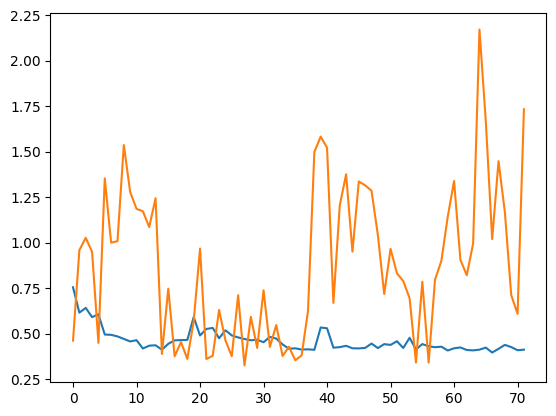

Epoch 73/90, Batch 10/76, Loss: 0.2028
Epoch 73/90, Batch 20/76, Loss: 0.4765
Epoch 73/90, Batch 30/76, Loss: 0.4968
Epoch 73/90, Batch 40/76, Loss: 0.4731
Epoch 73/90, Batch 50/76, Loss: 0.5908
Epoch 73/90, Batch 60/76, Loss: 0.3684
Epoch 73/90, Batch 70/76, Loss: 0.2633
|EPOCH 73| TRAIN_LOSS 0.3986031089566256| VALID_LOSS 0.42187682489554085|


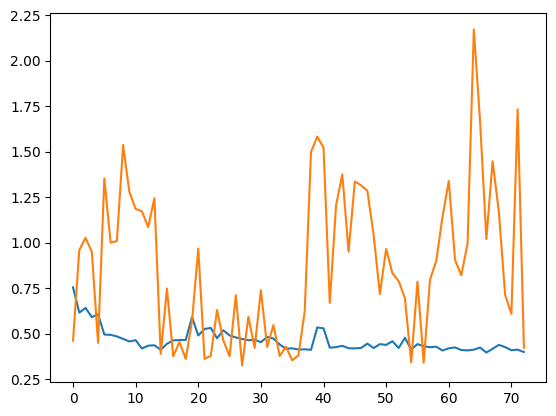

Epoch 74/90, Batch 10/76, Loss: 0.4414
Epoch 74/90, Batch 20/76, Loss: 0.4247
Epoch 74/90, Batch 30/76, Loss: 0.4644
Epoch 74/90, Batch 40/76, Loss: 0.4838
Epoch 74/90, Batch 50/76, Loss: 0.1878
Epoch 74/90, Batch 60/76, Loss: 0.4029
Epoch 74/90, Batch 70/76, Loss: 0.2039
|EPOCH 74| TRAIN_LOSS 0.3912045747825974| VALID_LOSS 0.3474189023176829|


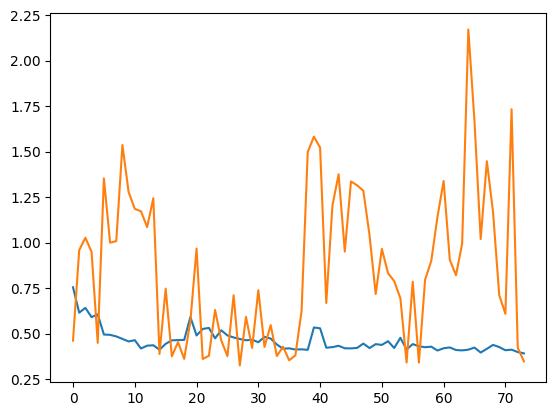

Epoch 75/90, Batch 10/76, Loss: 0.3051
Epoch 75/90, Batch 20/76, Loss: 0.4297
Epoch 75/90, Batch 30/76, Loss: 0.3129
Epoch 75/90, Batch 40/76, Loss: 0.2300
Epoch 75/90, Batch 50/76, Loss: 0.8322
Epoch 75/90, Batch 60/76, Loss: 0.2442
Epoch 75/90, Batch 70/76, Loss: 0.4117
|EPOCH 75| TRAIN_LOSS 0.3927807239325423| VALID_LOSS 0.3653884957234065|


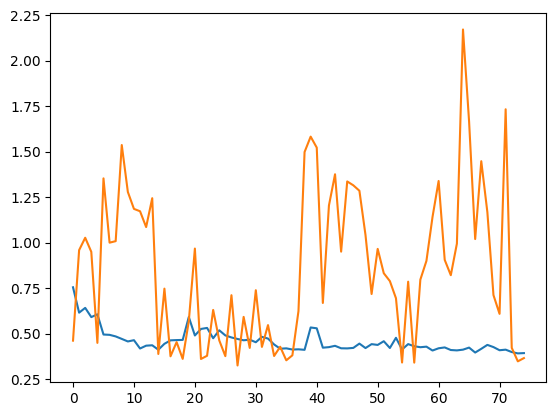

Epoch 76/90, Batch 10/76, Loss: 0.2927
Epoch 76/90, Batch 20/76, Loss: 0.4013
Epoch 76/90, Batch 30/76, Loss: 0.6620
Epoch 76/90, Batch 40/76, Loss: 0.6272
Epoch 76/90, Batch 50/76, Loss: 0.4219
Epoch 76/90, Batch 60/76, Loss: 0.3709
Epoch 76/90, Batch 70/76, Loss: 0.4450
|EPOCH 76| TRAIN_LOSS 0.44052524276469884| VALID_LOSS 0.3433635175228119|


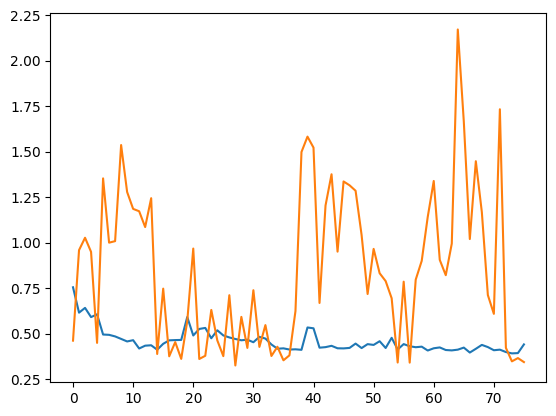

Epoch 77/90, Batch 10/76, Loss: 0.5000
Epoch 77/90, Batch 20/76, Loss: 0.5059
Epoch 77/90, Batch 30/76, Loss: 0.7340
Epoch 77/90, Batch 40/76, Loss: 0.2568
Epoch 77/90, Batch 50/76, Loss: 0.2224
Epoch 77/90, Batch 60/76, Loss: 0.9137
Epoch 77/90, Batch 70/76, Loss: 0.2736
|EPOCH 77| TRAIN_LOSS 0.4291188891388868| VALID_LOSS 0.42659083803494774|


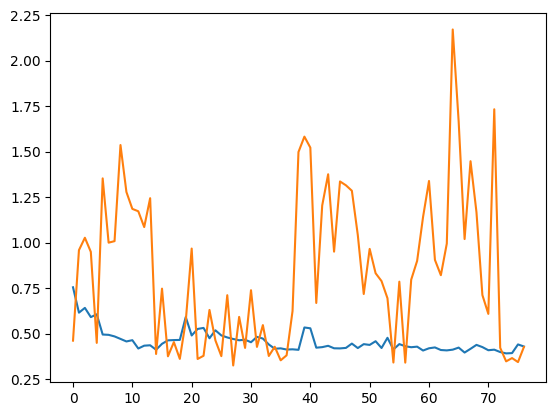

Epoch 78/90, Batch 10/76, Loss: 0.2145
Epoch 78/90, Batch 20/76, Loss: 0.3229
Epoch 78/90, Batch 30/76, Loss: 0.3586
Epoch 78/90, Batch 40/76, Loss: 0.1930
Epoch 78/90, Batch 50/76, Loss: 0.2166
Epoch 78/90, Batch 60/76, Loss: 0.2646
Epoch 78/90, Batch 70/76, Loss: 0.4645
|EPOCH 78| TRAIN_LOSS 0.40208955697323145| VALID_LOSS 0.370686674118042|


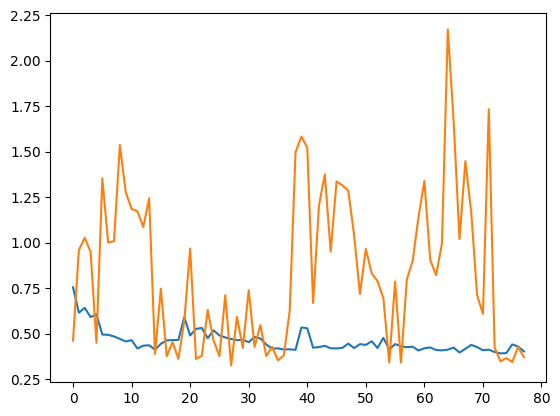

Epoch 79/90, Batch 10/76, Loss: 0.2906
Epoch 79/90, Batch 20/76, Loss: 0.3707
Epoch 79/90, Batch 30/76, Loss: 0.3192
Epoch 79/90, Batch 40/76, Loss: 0.4303
Epoch 79/90, Batch 50/76, Loss: 0.3300
Epoch 79/90, Batch 60/76, Loss: 0.2412
Epoch 79/90, Batch 70/76, Loss: 0.3626
|EPOCH 79| TRAIN_LOSS 0.418490694933816| VALID_LOSS 0.37726097206274667|


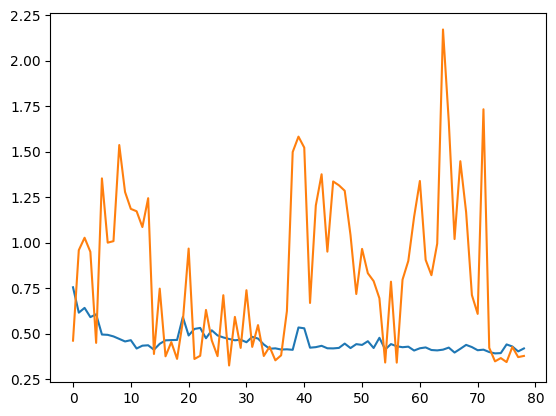

Epoch 80/90, Batch 10/76, Loss: 0.5807
Epoch 80/90, Batch 20/76, Loss: 0.4445
Epoch 80/90, Batch 30/76, Loss: 0.4882
Epoch 80/90, Batch 40/76, Loss: 0.3819
Epoch 80/90, Batch 50/76, Loss: 0.5922
Epoch 80/90, Batch 60/76, Loss: 0.5670
Epoch 80/90, Batch 70/76, Loss: 0.2219
|EPOCH 80| TRAIN_LOSS 0.4458297855759922| VALID_LOSS 0.338478717704614|


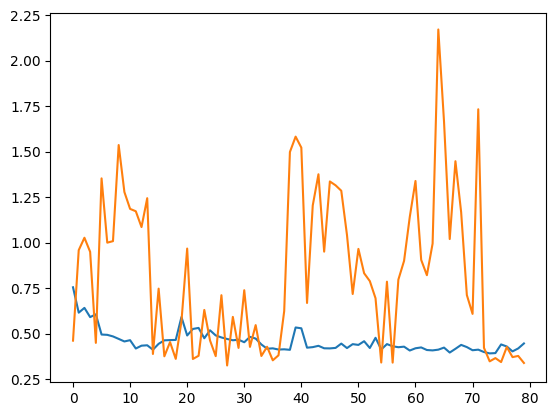

Epoch 81/90, Batch 10/76, Loss: 0.4289
Epoch 81/90, Batch 20/76, Loss: 0.3389
Epoch 81/90, Batch 30/76, Loss: 0.9202
Epoch 81/90, Batch 40/76, Loss: 0.3982
Epoch 81/90, Batch 50/76, Loss: 0.3813
Epoch 81/90, Batch 60/76, Loss: 0.4326
Epoch 81/90, Batch 70/76, Loss: 0.1565
|EPOCH 81| TRAIN_LOSS 0.41269929746263906| VALID_LOSS 0.3954110503196716|


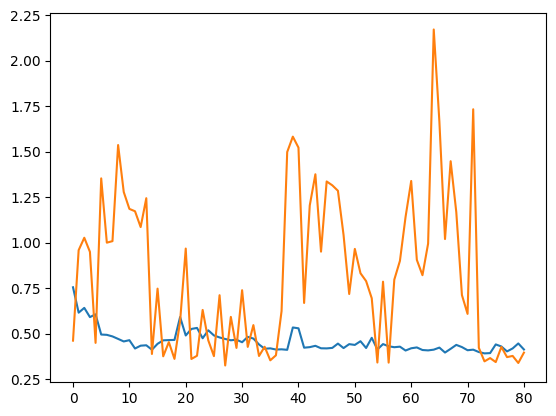

Epoch 82/90, Batch 10/76, Loss: 0.7841
Epoch 82/90, Batch 20/76, Loss: 0.2940
Epoch 82/90, Batch 30/76, Loss: 0.1956
Epoch 82/90, Batch 40/76, Loss: 0.7870
Epoch 82/90, Batch 50/76, Loss: 0.1690
Epoch 82/90, Batch 60/76, Loss: 0.2512
Epoch 82/90, Batch 70/76, Loss: 0.3965
|EPOCH 82| TRAIN_LOSS 0.406394244220696| VALID_LOSS 0.6714507381121317|


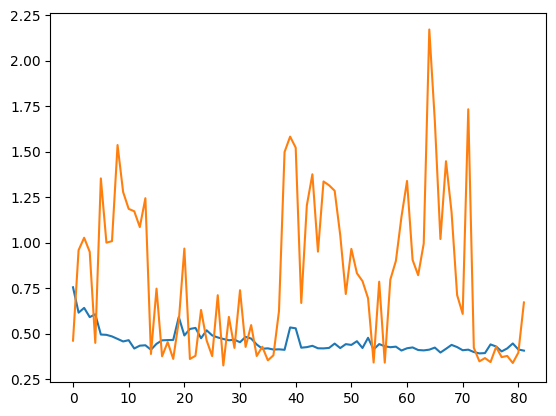

Epoch 83/90, Batch 10/76, Loss: 0.5917
Epoch 83/90, Batch 20/76, Loss: 0.3384
Epoch 83/90, Batch 30/76, Loss: 0.3816
Epoch 83/90, Batch 40/76, Loss: 0.2302
Epoch 83/90, Batch 50/76, Loss: 0.3758
Epoch 83/90, Batch 60/76, Loss: 0.7712
Epoch 83/90, Batch 70/76, Loss: 0.4702
|EPOCH 83| TRAIN_LOSS 0.4069021702989152| VALID_LOSS 0.372194962700208|


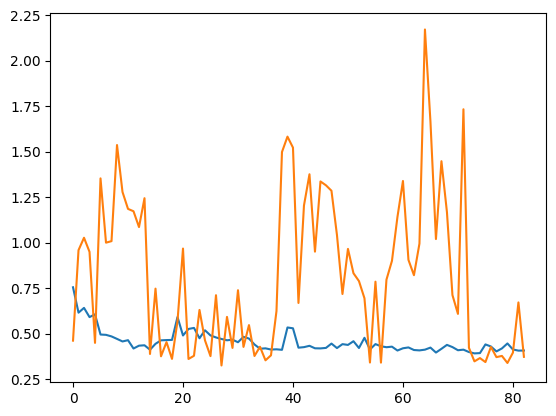

Epoch 84/90, Batch 10/76, Loss: 0.6439
Epoch 84/90, Batch 20/76, Loss: 0.3821
Epoch 84/90, Batch 30/76, Loss: 0.3708
Epoch 84/90, Batch 40/76, Loss: 0.5789
Epoch 84/90, Batch 50/76, Loss: 0.3141
Epoch 84/90, Batch 60/76, Loss: 0.2328
Epoch 84/90, Batch 70/76, Loss: 0.4834
|EPOCH 84| TRAIN_LOSS 0.4265028446128494| VALID_LOSS 0.38905066152413686|


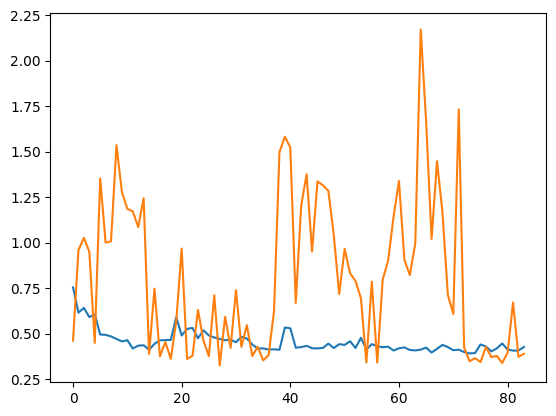

Epoch 85/90, Batch 10/76, Loss: 0.3333
Epoch 85/90, Batch 20/76, Loss: 0.5942
Epoch 85/90, Batch 30/76, Loss: 0.2840
Epoch 85/90, Batch 40/76, Loss: 0.7114
Epoch 85/90, Batch 50/76, Loss: 0.2319
Epoch 85/90, Batch 60/76, Loss: 0.6880
Epoch 85/90, Batch 70/76, Loss: 0.4054
|EPOCH 85| TRAIN_LOSS 0.4286471242575269| VALID_LOSS 0.4279082159201304|


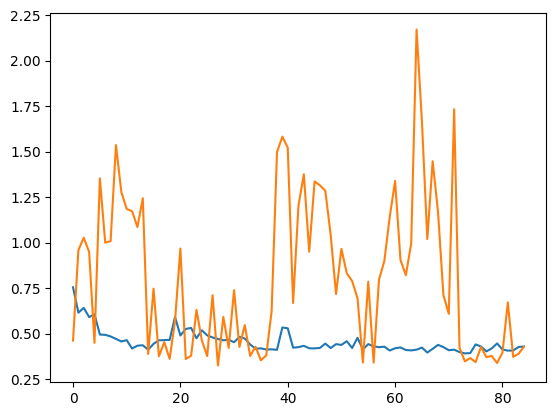

Epoch 86/90, Batch 10/76, Loss: 0.7511
Epoch 86/90, Batch 20/76, Loss: 0.3248
Epoch 86/90, Batch 30/76, Loss: 0.4849
Epoch 86/90, Batch 40/76, Loss: 0.6119
Epoch 86/90, Batch 50/76, Loss: 0.2936
Epoch 86/90, Batch 60/76, Loss: 0.3051
Epoch 86/90, Batch 70/76, Loss: 0.2751
|EPOCH 86| TRAIN_LOSS 0.46907747242795794| VALID_LOSS 1.0554558157920837|


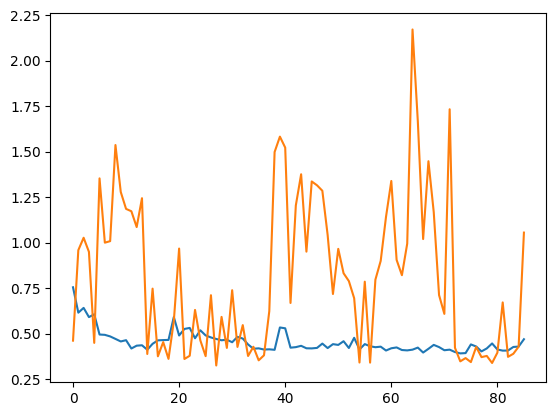

Epoch 87/90, Batch 10/76, Loss: 0.7496
Epoch 87/90, Batch 20/76, Loss: 0.5357
Epoch 87/90, Batch 30/76, Loss: 0.3815
Epoch 87/90, Batch 40/76, Loss: 0.3679
Epoch 87/90, Batch 50/76, Loss: 0.2411
Epoch 87/90, Batch 60/76, Loss: 0.4363
Epoch 87/90, Batch 70/76, Loss: 0.6120
|EPOCH 87| TRAIN_LOSS 0.4350487446706546| VALID_LOSS 0.39553560415903727|


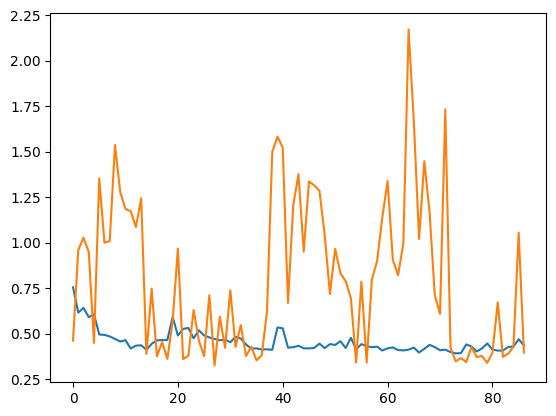

Epoch 88/90, Batch 10/76, Loss: 0.2602
Epoch 88/90, Batch 20/76, Loss: 0.5109
Epoch 88/90, Batch 30/76, Loss: 0.6939
Epoch 88/90, Batch 40/76, Loss: 0.5786
Epoch 88/90, Batch 50/76, Loss: 0.2525
Epoch 88/90, Batch 60/76, Loss: 0.6358
Epoch 88/90, Batch 70/76, Loss: 0.5117
|EPOCH 88| TRAIN_LOSS 0.42322850560671404| VALID_LOSS 1.121742876370748|


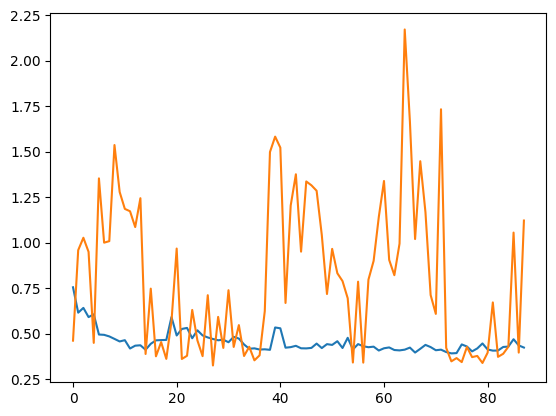

Epoch 89/90, Batch 10/76, Loss: 0.4489
Epoch 89/90, Batch 20/76, Loss: 0.4377
Epoch 89/90, Batch 30/76, Loss: 0.1724
Epoch 89/90, Batch 40/76, Loss: 0.4380
Epoch 89/90, Batch 50/76, Loss: 0.4955
Epoch 89/90, Batch 60/76, Loss: 0.7987
Epoch 89/90, Batch 70/76, Loss: 0.3769
|EPOCH 89| TRAIN_LOSS 0.4684691619324057| VALID_LOSS 0.8644793828328451|


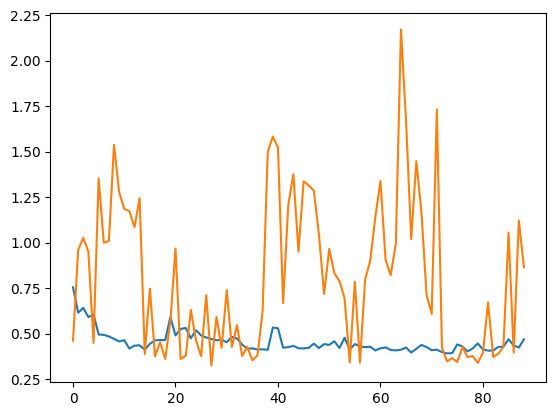

Epoch 90/90, Batch 10/76, Loss: 0.4620
Epoch 90/90, Batch 20/76, Loss: 0.3169
Epoch 90/90, Batch 30/76, Loss: 0.5304
Epoch 90/90, Batch 40/76, Loss: 0.4410
Epoch 90/90, Batch 50/76, Loss: 1.0231
Epoch 90/90, Batch 60/76, Loss: 0.3699
Epoch 90/90, Batch 70/76, Loss: 0.4611
|EPOCH 90| TRAIN_LOSS 0.46350937807246256| VALID_LOSS 0.5715502738952637|


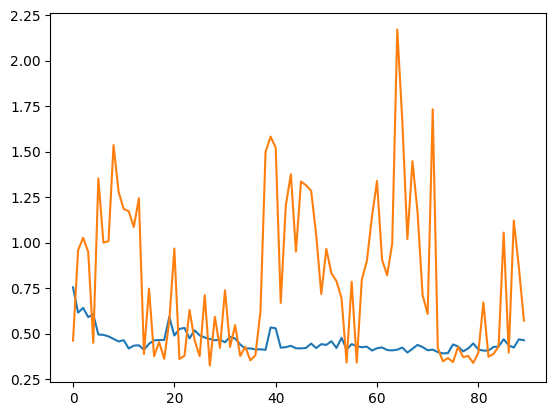

In [26]:
EPOCHS = 90
model.to(device)
run(model, 90, LR = 1e-4)

In [ ]:
model = DETRModel(num_classes, num_queries)
model.load_state_dict(torch.load('/content/detr_best_1.pth'))

Using cache found in /root/.cache/torch/hub/facebookresearch_detr_main
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


<All keys matched successfully>

## Train the model using PyTorch Lightning

Here we define a `LightningModule`, which is an `nn.Module` with some extra functionality.

For more information regarding PyTorch Lightning, I recommend the [docs](https://pytorch-lightning.readthedocs.io/en/latest/?_ga=2.35105442.2002381006.1623231889-1738348008.1615553774) as well as the [tutorial notebooks](https://github.com/PyTorchLightning/lightning-tutorials/tree/aeae8085b48339e9bd9ab61d81cc0dc8b0d48f9c/.notebooks/starters).

You can of course just train the model in native PyTorch as an alternative.

In [ ]:
model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50",
                                                             revision="no_timm",
                                                             num_labels=len(id2label),
                                                             ignore_mismatched_sizes=True)

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([3]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [ ]:
import pytorch_lightning as pl
from transformers import DetrConfig, DetrForObjectDetection
import torch

class Detr(pl.LightningModule):
     def __init__(self, lr, lr_backbone, weight_decay):
         super().__init__()
         # replace COCO classification head with custom head
         # we specify the "no_timm" variant here to not rely on the timm library
         # for the convolutional backbone
         self.model = DetrForObjectDetection.from_pretrained("facebook/detr-resnet-50",
                                                             revision="no_timm",
                                                             num_labels=len(id2label),
                                                             ignore_mismatched_sizes=True)
         # see https://github.com/PyTorchLightning/pytorch-lightning/pull/1896
         self.lr = lr
         self.lr_backbone = lr_backbone
         self.weight_decay = weight_decay

     def forward(self, pixel_values, pixel_mask):
       outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask)

       return outputs

     def common_step(self, batch, batch_idx):
       pixel_values = batch["pixel_values"]
       pixel_mask = batch["pixel_mask"]
       labels = [{k: v.to(self.device) for k, v in t.items()} for t in batch["labels"]]

       outputs = self.model(pixel_values=pixel_values, pixel_mask=pixel_mask, labels=labels)

       loss = outputs.loss
       loss_dict = outputs.loss_dict

       return loss, loss_dict

     def training_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        # logs metrics for each training_step,
        # and the average across the epoch
        self.log("training_loss", loss)
        for k,v in loss_dict.items():
          self.log("train_" + k, v.item())

        return loss

     def validation_step(self, batch, batch_idx):
        loss, loss_dict = self.common_step(batch, batch_idx)
        self.log("validation_loss", loss)
        for k,v in loss_dict.items():
          self.log("validation_" + k, v.item())

        return loss

     def configure_optimizers(self):
        param_dicts = [
              {"params": [p for n, p in self.named_parameters() if "backbone" not in n and p.requires_grad]},
              {
                  "params": [p for n, p in self.named_parameters() if "backbone" in n and p.requires_grad],
                  "lr": self.lr_backbone,
              },
        ]
        optimizer = torch.optim.AdamW(param_dicts, lr=self.lr,
                                  weight_decay=self.weight_decay)

        return optimizer

     def train_dataloader(self):
        return train_subset_loader

     def val_dataloader(self):
        return val_subset_loader

As PyTorch Lightning by default logs to Tensorboard, let's start it:

In [ ]:
# Start tensorboard.
%load_ext tensorboard
%tensorboard --logdir lightning_logs/

<IPython.core.display.Javascript object>

Here we define the model, and verify the outputs.

In [ ]:
model = Detr(lr=1e-4, lr_backbone=1e-5, weight_decay=1e-4)

outputs = model(pixel_values=batch['pixel_values'], pixel_mask=batch['pixel_mask'])

Some weights of DetrForObjectDetection were not initialized from the model checkpoint at facebook/detr-resnet-50 and are newly initialized because the shapes did not match:
- class_labels_classifier.weight: found shape torch.Size([92, 256]) in the checkpoint and torch.Size([3, 256]) in the model instantiated
- class_labels_classifier.bias: found shape torch.Size([92]) in the checkpoint and torch.Size([3]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


The logits are of shape `(batch_size, num_queries, number of classes + 1)`. We model internally adds an additional "no object class", which explains why we have one additional output for the class dimension.

In [ ]:
outputs.logits.shape

torch.Size([4, 100, 3])

# Train
Next, let's train! We train for 50 epochs, and also use gradient clipping. You can refresh Tensorboard above to check **the** various losses.

In [ ]:
from pytorch_lightning import Trainer

trainer = Trainer(devices=1, max_epochs=50, gradient_clip_val=0.1)
trainer.fit(model)

INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:IPU available: False, using: 0 IPUs
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.callbacks.model_summary:
  | Name  | Type                   | Params
-------------------------------------------------
0 | model | DetrForObjectDetection | 41.5 M
-------------------------------------------------
18.0 M    Trainable params
23.5 M    Non-trainable params
41.5 M    Total params
166.008   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=1` in the `DataLoader` to improve performance.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/utilities/data.py:77: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 2. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
/usr/local/lib/python3.10/dist-packages/pytorch_lightning/trainer/connectors/data_connector.py:441: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=1` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=50` reached.


# Or Load a Model

In [ ]:
# load DETR trained for 50 epochs
!wget -O model_detr_50_epochs.pt https://aml-2023.s3.eu-north-1.amazonaws.com/final-project/model_detr_50_epochs.pt

model.load_state_dict(torch.load("model_detr_50_epochs.pt", map_location=device))

--2023-12-12 09:56:35--  https://aml-2023.s3.eu-north-1.amazonaws.com/final-project/model_detr_50_epochs.pt
Resolving aml-2023.s3.eu-north-1.amazonaws.com (aml-2023.s3.eu-north-1.amazonaws.com)... 16.12.11.22, 52.95.169.52
Connecting to aml-2023.s3.eu-north-1.amazonaws.com (aml-2023.s3.eu-north-1.amazonaws.com)|16.12.11.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 166665452 (159M) [binary/octet-stream]
Saving to: ‘model_detr_50_epochs.pt’

model_detr_50_epoch 100%[===================>] 158.94M  23.4MB/s    in 8.1s    

2023-12-12 09:56:44 (19.6 MB/s) - ‘model_detr_50_epochs.pt’ saved [166665452/166665452]



<All keys matched successfully>

## Evaluate the model

The evaluation code below is written by the balloon guy, I think we can just write our own to avoid having to rely on his code for that.

Finally, we evaluate the model on the validation set. For this we make use of the `CocoEvaluator` class available in a [tiny PyPi package](https://github.com/NielsRogge/coco-eval) I made. This class is entirely based on the original evaluator class used by the DETR authors.

To run the evaluation, we must make sure that the outputs of the model are in the format that the metric expects. For that we need to turn the boxes which are in (x1, y1, x2, y2) format into (x, y, width, height), and turn the predictions into a list of dictionaries:

In [ ]:
def convert_to_xywh(boxes):
    xmin, ymin, xmax, ymax = boxes.unbind(1)
    return torch.stack((xmin, ymin, xmax - xmin, ymax - ymin), dim=1)

def prepare_for_coco_detection(predictions):
    coco_results = []
    for original_id, prediction in predictions.items():
        if len(prediction) == 0:
            continue

        boxes = prediction["boxes"]
        boxes = convert_to_xywh(boxes).tolist()
        scores = prediction["scores"].tolist()
        labels = prediction["labels"].tolist()

        coco_results.extend(
            [
                {
                    "image_id": original_id,
                    "category_id": labels[k],
                    "bbox": box,
                    "score": scores[k],
                }
                for k, box in enumerate(boxes)
            ]
        )
    return coco_results

# OUR EVALUATION
Our evaluation should do something like this, loop over the dataloader, prepare the inputs to the model, and then we need to get the metrics we are interested in.

* MAP
* GIoU
* L1 Bbox error

In [42]:
import torch
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval
from tqdm import tqdm

# Assuming you have already loaded your fine-tuned model, val_dataloader, and COCO annotations
# Make sure to install pycocotools using: pip install pycocotools

model.to(device)
model.eval()

coco_gt = COCO("data/valid/_annotations.coco.json" )  # Load COCO annotations for the validation set
evaluator = CocoEvaluator(coco_gt = coco_gt, iou_types=["bbox"])

print("Running evaluation...")
for idx, batch in enumerate(tqdm(val_dataloader)):
    # get the inputs
    pixel_values = batch["pixel_values"].to(device)
    pixel_mask = batch["pixel_mask"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]] # these are in DETR format, resized + normalized

    # forward pass
    with torch.no_grad():
      outputs = model(pixel_values)

    # turn into a list of dictionaries (one item for each example in the batch)
    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes)

    # provide to metric
    # metric expects a list of dictionaries, each item
    # containing image_id, category_id, bbox and score keys
    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

loading annotations into memory...
Done (t=0.00s)
creating index...
index created!


NameError: ignored

THIS IS BY THE BALLOON GUY. I am leaving it in for now just for reference.

In [ ]:
from coco_eval import CocoEvaluator
from tqdm.notebook import tqdm

import numpy as np

model.to(device)
# initialize evaluator with ground truth (gt)
evaluator = CocoEvaluator(coco_gt=val_subset.coco, iou_types=["bbox"])

print("Running evaluation...")
for idx, batch in enumerate(tqdm(val_dataloader)):
    # get the inputs
    pixel_values = batch["pixel_values"].to(device)
    pixel_mask = batch["pixel_mask"].to(device)
    labels = [{k: v.to(device) for k, v in t.items()} for t in batch["labels"]] # these are in DETR format, resized + normalized

    # forward pass
    with torch.no_grad():
      outputs = model(pixel_values=pixel_values, pixel_mask=pixel_mask)

    # turn into a list of dictionaries (one item for each example in the batch)
    orig_target_sizes = torch.stack([target["orig_size"] for target in labels], dim=0)
    results = processor.post_process_object_detection(outputs, target_sizes=orig_target_sizes)

    # provide to metric
    # metric expects a list of dictionaries, each item
    # containing image_id, category_id, bbox and score keys
    predictions = {target['image_id'].item(): output for target, output in zip(labels, results)}
    predictions = prepare_for_coco_detection(predictions)
    evaluator.update(predictions)

evaluator.synchronize_between_processes()
evaluator.accumulate()
evaluator.summarize()

## Inference (+ visualization)

Let's visualize the predictions of DETR on the first image of the validation set.

In [ ]:
#We can use the image_id in target to know which image it is
pixel_values, target = val_subset[10]

In [ ]:
pixel_values = pixel_values.unsqueeze(0).to(device)
print(pixel_values.shape)

torch.Size([1, 3, 800, 800])


In [ ]:
with torch.no_grad():
  # forward pass to get class logits and bounding boxes
  outputs = model(pixel_values=pixel_values, pixel_mask=None)
print("Outputs:", outputs.keys())

Outputs: odict_keys(['logits', 'pred_boxes', 'last_hidden_state', 'encoder_last_hidden_state'])


In [ ]:
import matplotlib.pyplot as plt

# colors for visualization
COLORS = [[0.000, 0.447, 0.741], [0.850, 0.325, 0.098], [0.929, 0.694, 0.125],
          [0.494, 0.184, 0.556], [0.466, 0.674, 0.188], [0.301, 0.745, 0.933]]

def plot_results(pil_img, scores, labels, boxes):
    plt.figure(figsize=(16,10))
    plt.imshow(pil_img)
    ax = plt.gca()
    colors = COLORS * 100
    for score, label, (xmin, ymin, xmax, ymax),c  in zip(scores.tolist(), labels.tolist(), boxes.tolist(), colors):
        ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                   fill=False, color=c, linewidth=3))
        #text = f'{model.config.id2label[label]}: {score:0.2f}'
        #ax.text(xmin, ymin, text, fontsize=15,
                #bbox=dict(facecolor='yellow', alpha=0.5))
    plt.axis('off')
    plt.show()

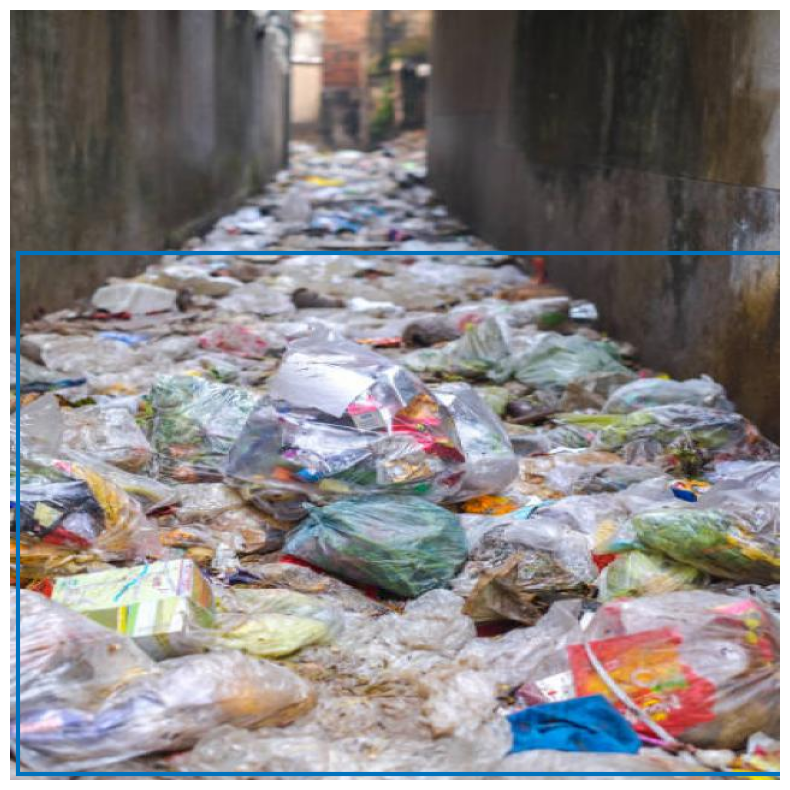

In [ ]:
# load image based on ID
image_id = target['image_id'].item()
image = val_dataset.coco.loadImgs(image_id)[0]
image = Image.open(os.path.join('data/valid', image['file_name']))

# postprocess model outputs
width, height = image.size
postprocessed_outputs = processor.post_process_object_detection(outputs,
                                                                target_sizes=[(height, width)],
                                                                threshold=0.9)
results = postprocessed_outputs[0]
plot_results(image, results['scores'], results['labels'], results['boxes'])

## Attention map

DETR is a model composed of mostly 2 components a CNN and a transformers built on top of it. So something we can try to do is take a look at the attention map of the transformer to see if they can be used to better intepret the model.

In [27]:
for i in test_dataloader:
  img = i['pixel_values']
  break

In [29]:
import matplotlib.pyplot as plt

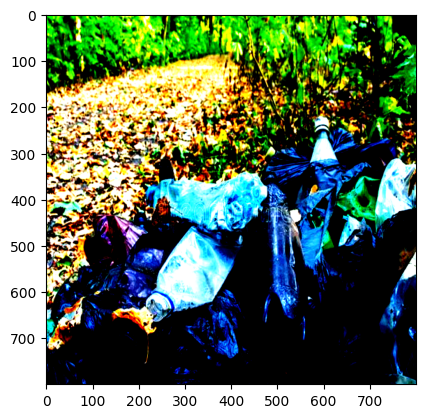

In [30]:
plt.imshow(img[0].permute(1,2,0))

In [ ]:
enc_attn_weights.shape

torch.Size([2, 625, 625])

In [33]:
model(img_1)

RuntimeError: ignored

In [31]:
def hook_conv(module, input, output):
  global conv_features
  conv_features = output

def hook_enc_attn(module, input, output):
  global enc_attn_weights
  enc_attn_weights = output[1]

def hook_dec_attn(module, input, output):
  global dec_attn_weights
  dec_attn_weights = output[1]

In [32]:
img_1 = img[0]
img_1 = img_1.unsqueeze(0)

In [34]:
# use lists to store the outputs via up-values
model.to(device)
conv_features, enc_attn_weights, dec_attn_weights = [], [], []

hooks = [
     model.model.backbone[-2].register_forward_hook(
        hook_conv),
    model.model.transformer.encoder.layers[-1].self_attn.register_forward_hook(
        hook_enc_attn),
    model.model.transformer.decoder.layers[-1].self_attn.register_forward_hook(
        hook_dec_attn),
]

# propagate through the model
outputs = model(img_1.to(device))

for hook in hooks:
    hook.remove()


In [35]:
# standard PyTorch mean-std input image normalization
transform = torchvision.transforms.Compose([
    torchvision.transforms.Resize(800),
    torchvision.transforms.ToTensor(),
    torchvision.transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
])

# for output bounding box post-processing
def box_cxcywh_to_xyxy(x):
    x_c, y_c, w, h = x.unbind(1)
    b = [(x_c - 0.5 * w), (y_c - 0.5 * h),
         (x_c + 0.5 * w), (y_c + 0.5 * h)]
    return torch.stack(b, dim=1)

def rescale_bboxes(out_bbox, size):
    img_w, img_h = size
    b = box_cxcywh_to_xyxy(out_bbox)
    b = b * torch.tensor([img_w, img_h, img_w, img_h], dtype=torch.float32)
    return b

In [36]:
probas = outputs['pred_logits'].softmax(-1)[0, :, :-1]
keep = probas.max(-1).values > 0.5
# convert boxes from [0; 1] to image scales
bboxes_scaled = rescale_bboxes(outputs['pred_boxes'][0, keep].cpu(),img_1.size()[-2:])

In [37]:
# get the feature map shape
h, w = conv_features['0'].tensors.shape[-2:]

fig, axs = plt.subplots(ncols=len(bboxes_scaled), nrows=2, figsize=(22, 7))
#colors = COLORS * 100
for idx, ax_i, (xmin, ymin, xmax, ymax) in zip(keep.nonzero(), axs.T, bboxes_scaled.detach().numpy()):
    ax = ax_i[0]
    ax.imshow(enc_attn_weights[0, idx].view(25, 25).cpu().detach().numpy())
    ax.axis('off')
    ax.set_title(f'query id: {idx.item()}')
    ax = ax_i[1]
    ax.imshow(img_1.squeeze().permute(1,2,0).cpu().detach().numpy())
    ax.add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                               fill=False, color='blue', linewidth=3))
    ax.axis('off')
    #ax.set_title(CLASSES[probas[idx].argmax()])
fig.tight_layout()

ValueError: ignored

<Figure size 2200x700 with 0 Axes>

In [ ]:
model.to(device)

attention_maps = None

def hook_new(module, input, output):
    '''
    Funciton that in the forward pass of the model will trigger after computing
    the attention and return it's value to a global variable
    '''
    global attention_maps
    attention_maps = output[0]

# Attach hook to the self attention in the encoder
hook_layer = model.model.model.encoder.layers[0].self_attn
# And set the function to be trigged
hook_handle = hook_layer.register_forward_hook(hook_new)

# Forward of the model
image_tensor = sample['pixel_values'].clone().requires_grad_(True)
output = model(pixel_values=image_tensor, pixel_mask = sample['pixel_mask'])

# Detach the hook
hook_handle.remove()

# Access attention maps
attention_maps #= attention_maps.squeeze()
#attention_maps.backward()

tensor([[[-0.3228, -0.0113, -0.4381,  ...,  0.1157,  0.1526, -0.0092],
         [-0.3220, -0.0115, -0.2568,  ...,  0.1214,  0.0855,  0.0279],
         [-0.3191, -0.1054, -0.1291,  ...,  0.1426,  0.0036, -0.0231],
         ...,
         [-0.0096,  0.1339, -0.0345,  ...,  0.2399,  0.1326, -0.0421],
         [ 0.1290, -0.1674,  0.2907,  ..., -0.0549,  0.0217, -0.2715],
         [ 0.1630, -0.2427,  0.3552,  ..., -0.0183,  0.0360, -0.3013]]],
       device='cuda:0', grad_fn=<ViewBackward0>)

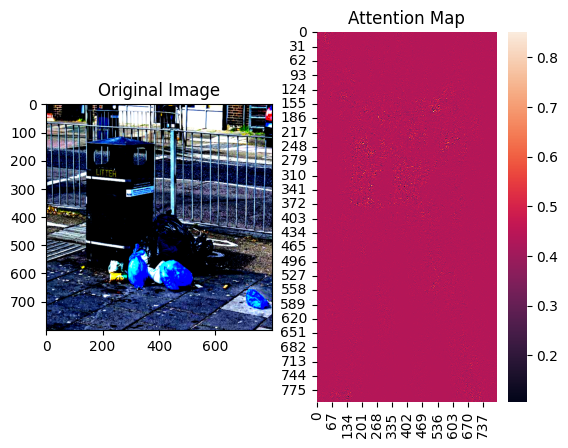

In [ ]:
# Get the gradients of the image
image_gradients = image_tensor.grad

# Normalize the gradients for visualization
image_gradients = (image_gradients - image_gradients.min()) / (image_gradients.max() - image_gradients.min())

# Convert the gradients to a NumPy array
image_gradients_np = image_gradients.squeeze().permute(1,2,0).detach().cpu().numpy()

# Plot the original image and the attention map
import matplotlib.pyplot as plt

plt.subplot(1, 2, 1)
plt.imshow(input_image)
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.title("Attention Map")
sns.heatmap(np.mean(image_gradients_np, axis = -1))
plt.show()
